# Financial Machine Learning

June 2025 \\
FInancial AI Convergece \\
Chung-Ang University Business School

In [ ]:
!pip install yfinance ta xgboost --quiet
#!pip install talib

  Preparing metadata (setup.py) ... done


In [110]:
# 폰트 설치
!apt-get update -qq && apt-get install fonts-nanum* -qq
# matplotlib 설정
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
# 폰트 매니저 재초기화
fm.fontManager.__init__()
# 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumBarunGothic'
plt.rcParams['axes.unicode_minus'] = False
print("한글 폰트 설정 완료!")

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
한글 폰트 설정 완료!


In [111]:
import yfinance as yf
import numpy as np
import pandas as pd
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import ta
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import seaborn as sns


In [112]:
# 한글 폰트 설정 (필요에 따라 주석 해제 또는 조정)
try:
#    matplotlib.rcParams['font.family'] = 'NanumGothic'
    plt.rcParams['font.family'] = 'NanumBarunGothic'
    plt.rcParams['axes.unicode_minus'] = False
except:
    pltb.rcParams['font.family'] = 'sans-serif'

## 1. 데이터 수집 및 전처리

In [113]:
def download_korean_stocks():
# KTOP30 구성 종목
  tickers = {
    "삼성전자": "005930.KS",
    "LG에너지솔루션": "373220.KS",
    "현대모비스": "012330.KS",
    "SK텔레콤": "017670.KS",
    "POSCO홀딩스": "005490.KS",
    "NAVER": "035420.KQ",
    "LG전자": "066570.KQ",
    "LG화학": "051910.KQ",
    "SK하이닉스": "000660.KS",
    "카카오": "035720.KQ",
    "삼성SDI": "006400.KS",
    "현대차": "005380.KS",
    "기아": "000270.KS",
    "SK이노베이션": "096770.KQ",
    "SK": "034730.KS",
    "삼성물산": "028260.KS",
    "한화솔루션": "009830.KS",
    "KT&G": "033780.KS",
    "삼성생명": "032830.KS",
    "삼성화재": "000810.KS",
    "롯데케미칼": "011170.KS",
    "LG생활건강": "051900.KQ",
    "고려아연": "010130.KS",
    "S-Oil": "010950.KS",
    "현대글로비스": "086280.KQ",
    "CJ제일제당": "097950.KQ",
    "KT": "030200.KS",
    "하나금융지주": "086790.KQ",
    "신한지주": "055550.KQ",
    "KB금융": "105560.KQ",
    "KTOP30": "^KTOP30" # KTOP30
   }

#    tickers = {
#        '삼성전자': '005930.KS',
#        '현대차': '005380.KS',
#        'SK하이닉스': '000660.KS',
#        'LG화학' : '051910.KS',
#        'LG전자' : '066570.KS',
#        '기아' : '035420.KS',
#        'KOSPI': '^KS200' # KOSPI는 예측 대상이 아니므로 차트에서 제외할 수 있습니다.
#    }

  stock_data = {}
  for name, ticker in tickers.items():
      print(f"\n{name} 데이터 다운로드 중...")
      try:
            # Start date를 2020-01-01로 조정하여 process_and_plot_all_stocks와 일관성 유지
            data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
            if isinstance(data.columns, pd.MultiIndex):
                data.columns = data.columns.get_level_values(0)
            if not data.empty:
                data = data[['Open', 'High', 'Low', 'Close', 'Volume']]
                stock_data[name] = data
                print(f"{name}: {len(data)}개 데이터 포인트")
                # print(f"\n{name} 데이터 샘플 (head):\n{data.head()}") # 주석 처리하여 출력 간소화
                # print(f"\n{name} 종가 및 거래량 기초통계:") # 주석 처리하여 출력 간소화
                # print(data[['Close', 'Volume']].describe().round(2).to_string())
            else:
                print(f"{name}: 데이터를 찾을 수 없습니다.")
      except Exception as e:
            print(f"{name} 다운로드 실패: {e}")
  return stock_data

In [114]:
def calculate_sma(data, period): return data.rolling(window=period).mean()
def calculate_ema(data, period): return data.ewm(span=period).mean()
def calculate_rsi(data, period=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0).rolling(window=period).mean()
    loss = -delta.where(delta < 0, 0).rolling(window=period).mean()
    rs = gain / loss
    rs = rs.where(loss != 0, 0).replace([np.inf, -np.inf], 0)
    return (100 - (100 / (1 + rs))).fillna(0)

def calculate_macd(data, fast=12, slow=26, signal=9):
    ema_fast = calculate_ema(data, fast)
    ema_slow = calculate_ema(data, slow)
    macd = ema_fast - ema_slow
    macd_signal = calculate_ema(macd, signal)
    return macd.fillna(0), macd_signal.fillna(0), (macd - macd_signal).fillna(0)

def calculate_bollinger_bands(data, period=20, std_dev=2):
    sma = calculate_sma(data, period)
    std = data.rolling(window=period).std()
    return (sma + std * std_dev).fillna(0), sma.fillna(0), (sma - std * std_dev).fillna(0)

def calculate_obv(close, volume):
    direction = np.sign(close.diff())
    return (direction * volume).fillna(0).cumsum()

def calculate_technical_indicators(data):
    df = data.copy()
    try:
        df['SMA_20'] = calculate_sma(df['Close'], 20)
        df['SMA_50'] = calculate_sma(df['Close'], 50)
        df['EMA_12'] = calculate_ema(df['Close'], 12)
        df['EMA_26'] = calculate_ema(df['Close'], 26)
        df['RSI'] = calculate_rsi(df['Close'])
        df['MACD'], df['MACD_Signal'], df['MACD_Hist'] = calculate_macd(df['Close'])
        df['BB_Upper'], df['BB_Middle'], df['BB_Lower'] = calculate_bollinger_bands(df['Close'])
        df['OBV'] = calculate_obv(df['Close'], df['Volume'])
        print("기술지표 계산 완료!")
    except Exception as e:
        print(f"기술지표 계산 실패: {e}")
    return df

def save_combined_dataframe(stock_data_with_indicators):
    """
    모든 주식 데이터를 하나의 DataFrame으로 결합하여 저장
    """
    combined_data = []

    for stock_name, data in stock_data_with_indicators.items():
        if data.empty:
            continue

        # 각 주식의 데이터에 주식명 컬럼 추가
        temp_data = data.copy()
        temp_data['Stock_Name'] = stock_name
        temp_data['Date'] = temp_data.index

        # 컬럼 순서 재정렬 (주식명과 날짜를 맨 앞으로)
        columns_order = ['Stock_Name', 'Date'] + [col for col in temp_data.columns if col not in ['Stock_Name', 'Date']]
        temp_data = temp_data[columns_order]

        combined_data.append(temp_data)

    if combined_data:
        # 모든 데이터를 하나의 DataFrame으로 결합
        final_df = pd.concat(combined_data, ignore_index=True)

        # CSV 파일로 저장
        final_df.to_csv('korean_stocks_with_indicators.csv', index=False, encoding='utf-8-sig')
        print(f"\n통합 데이터 저장 완료: korean_stocks_with_indicators.csv")
        print(f"총 {len(final_df)}개 행, {len(final_df.columns)}개 컬럼")

        return final_df
    else:
        print("저장할 데이터가 없습니다.")
        return pd.DataFrame()

def display_combined_dataframe_info(combined_df):
    """
    통합 DataFrame의 정보와 샘플 데이터 출력
    """
    if combined_df.empty:
        print("통합 DataFrame이 비어있습니다.")
        return

    print("\n" + "="*80)
    print("통합 DataFrame 정보")
    print("="*80)

    # 기본 정보
    print(f"전체 데이터 크기: {combined_df.shape}")
    print(f"주식 종목: {combined_df['Stock_Name'].unique().tolist()}")
    print(f"날짜 범위: {combined_df['Date'].min()} ~ {combined_df['Date'].max()}")

    # 컬럼 정보
    print(f"\n컬럼 목록 ({len(combined_df.columns)}개):")
    for i, col in enumerate(combined_df.columns):
        print(f"{i+1:2d}. {col}")

    # 각 주식별 데이터 개수
    print(f"\n주식별 데이터 개수:")
    stock_counts = combined_df['Stock_Name'].value_counts()
    for stock, count in stock_counts.items():
        print(f"  {stock}: {count:,}개")

    # 상위 5개 데이터 출력
    print(f"\n통합 DataFrame 상위 5개 데이터:")
    print(combined_df.head())

    # 각 주식별 최신 데이터 5개씩 출력
    print(f"\n각 주식별 최신 데이터 (5개씩):")
    for stock_name in combined_df['Stock_Name'].unique():
        stock_data = combined_df[combined_df['Stock_Name'] == stock_name].tail(5)
        print(f"\n--- {stock_name} 최신 5개 데이터 ---")
        print(stock_data[['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'SMA_20', 'RSI', 'MACD']].to_string(index=False))

def display_indicators_summary(stock_data_with_indicators):
    for stock_name, data in stock_data_with_indicators.items():
        print(f"\n=== {stock_name} 기술지표 최근 값 ===")
        if data.empty:
            print(f"{stock_name}: 데이터가 비어 있습니다.")
            continue
        latest_data = data.iloc[-1]
        for key, label, unit, fmt in [
            ('Close', '종가', '원', ',.0f'),
            ('SMA_20', 'SMA 20일', '원', ',.0f'),
            ('SMA_50', 'SMA 50일', '원', ',.0f'),
            ('RSI', 'RSI', '', '.2f'),
            ('MACD', 'MACD', '', '.2f'),
            ('BB_Upper', '볼린저밴드 상단', '원', ',.0f'),
            ('BB_Lower', '볼린저밴드 하단', '원', ',.0f')
        ]:
            val = latest_data.get(key, np.nan)
            if isinstance(val, pd.Series) or pd.isna(val):
                print(f"{label}: 데이터 없음 또는 유효하지 않음")
            else:
                try:
                    print(f"{label}: {format(val, fmt)}{unit}")
                except Exception as e:
                    print(f"{label}: {val}{unit} (포맷 오류: {e})")

def generate_chartjs_config(stock_data, stock_name):
    data = stock_data[stock_name].tail(60)
    close_prices = data['Close'].round(0).astype(float).values.tolist()
    sma_20 = data['SMA_20'].round(0).astype(float).values.tolist()
    bb_upper = data['BB_Upper'].round(0).astype(float).values.tolist()
    bb_lower = data['BB_Lower'].round(0).astype(float).values.tolist()
    dates = data.index.strftime('%Y-%m-%d').tolist()

    chart_config = {
        "type": "line",
        "data": {
            "labels": dates,
            "datasets": [
                {"label": f"{stock_name} 종가", "data": close_prices, "borderColor": "#1e88e5", "fill": False, "yAxisID": "y"},
                {"label": "SMA 20일", "data": sma_20, "borderColor": "#43a047", "fill": False, "yAxisID": "y"},
                {"label": "볼린저밴드 상단", "data": bb_upper, "borderColor": "#e53935",
                 "fill": {"target": "+1", "value": bb_lower, "above": "rgba(229, 57, 53, 0.2)"}, "yAxisID": "y"},
                {"label": "볼린저밴드 하단", "data": bb_lower, "borderColor": "#e53935", "fill": False, "yAxisID": "y"}
            ]
        },
        "options": {
            "responsive": True,
            "interaction": {"mode": "index", "intersect": False},
            "scales": {
                "x": {"title": {"display": True, "text": "날짜"}},
                "y": {"title": {"display": True, "text": "가격 (원)"}, "beginAtZero": False}
            },
            "plugins": {
                "title": {"display": True, "text": f"{stock_name} 주가 및 볼린저 밴드 (최근 60일)",
                          "font": {"family": "NanumGothic"}},
                "legend": {"position": "top"}
            }
        }
    }
    return chart_config

def main():
    print("한국 주식 기술분석 프로그램 시작")
    print("=" * 50)

    stock_data = download_korean_stocks()
    if len(stock_data) == 0:
        print("다운로드된 데이터가 없습니다.")
        return

    stock_data_with_indicators = {}
    for stock_name, df in stock_data.items():
        print(f"\n{stock_name} 기술지표 계산 중...")
        if df.empty:
            print(f"{stock_name} 데이터가 비어 있습니다.")
            continue
        stock_data_with_indicators[stock_name] = calculate_technical_indicators(df)

    display_indicators_summary(stock_data_with_indicators)

    # 통합 DataFrame 생성 및 저장
    combined_df = save_combined_dataframe(stock_data_with_indicators)

    # 통합 DataFrame 정보 출력
    display_combined_dataframe_info(combined_df)

    for stock_name in stock_data_with_indicators:
        print(f"\n{stock_name} 차트 생성 중...")
        chart_config = generate_chartjs_config(stock_data_with_indicators, stock_name)
        print(f"{stock_name} Chart.js 구성:")
        print(chart_config)

if __name__ == "__main__":
    main()

한국 주식 기술분석 프로그램 시작

삼성전자 데이터 다운로드 중...
삼성전자: 1229개 데이터 포인트

LG에너지솔루션 데이터 다운로드 중...
LG에너지솔루션: 716개 데이터 포인트

현대모비스 데이터 다운로드 중...
현대모비스: 1229개 데이터 포인트

SK텔레콤 데이터 다운로드 중...
SK텔레콤: 1229개 데이터 포인트

POSCO홀딩스 데이터 다운로드 중...
POSCO홀딩스: 1229개 데이터 포인트

NAVER 데이터 다운로드 중...
NAVER: 1229개 데이터 포인트

LG전자 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

LG전자: 1229개 데이터 포인트

LG화학 데이터 다운로드 중...
LG화학: 1229개 데이터 포인트

SK하이닉스 데이터 다운로드 중...
SK하이닉스: 1229개 데이터 포인트

카카오 데이터 다운로드 중...
카카오: 1229개 데이터 포인트

삼성SDI 데이터 다운로드 중...
삼성SDI: 1229개 데이터 포인트

현대차 데이터 다운로드 중...
현대차: 1229개 데이터 포인트

기아 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

기아: 1229개 데이터 포인트

SK이노베이션 데이터 다운로드 중...
SK이노베이션: 1229개 데이터 포인트

SK 데이터 다운로드 중...
SK: 1229개 데이터 포인트

삼성물산 데이터 다운로드 중...
삼성물산: 1229개 데이터 포인트

한화솔루션 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)


한화솔루션: 1229개 데이터 포인트

KT&G 데이터 다운로드 중...
KT&G: 1229개 데이터 포인트

삼성생명 데이터 다운로드 중...
삼성생명: 1229개 데이터 포인트

삼성화재 데이터 다운로드 중...
삼성화재: 1229개 데이터 포인트

롯데케미칼 데이터 다운로드 중...
롯데케미칼: 1229개 데이터 포인트

LG생활건강 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)


LG생활건강: 1229개 데이터 포인트

고려아연 데이터 다운로드 중...
고려아연: 1229개 데이터 포인트

S-Oil 데이터 다운로드 중...
S-Oil: 1229개 데이터 포인트

현대글로비스 데이터 다운로드 중...
현대글로비스: 1229개 데이터 포인트

CJ제일제당 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

CJ제일제당: 1229개 데이터 포인트

KT 데이터 다운로드 중...
KT: 1229개 데이터 포인트

하나금융지주 데이터 다운로드 중...
하나금융지주: 1229개 데이터 포인트

신한지주 데이터 다운로드 중...
신한지주: 1229개 데이터 포인트

KB금융 데이터 다운로드 중...
KB금융: 1229개 데이터 포인트

KTOP30 데이터 다운로드 중...
KTOP30: 데이터를 찾을 수 없습니다.

삼성전자 기술지표 계산 중...
기술지표 계산 완료!

LG에너지솔루션 기술지표 계산 중...
기술지표 계산 완료!

현대모비스 기술지표 계산 중...
기술지표 계산 완료!

SK텔레콤 기술지표 계산 중...
기술지표 계산 완료!

POSCO홀딩스 기술지표 계산 중...
기술지표 계산 완료!

NAVER 기술지표 계산 중...
기술지표 계산 완료!

LG전자 기술지표 계산 중...
기술지표 계산 완료!

LG화학 기술지표 계산 중...
기술지표 계산 완료!

SK하이닉스 기술지표 계산 중...
기술지표 계산 완료!

카카오 기술지표 계산 중...
기술지표 계산 완료!

삼성SDI 기술지표 계산 중...
기술지표 계산 완료!

현대차 기술지표 계산 중...
기술지표 계산 완료!

기아 기술지표 계산 중...
기술지표 계산 완료!

SK이노베이션 기술지표 계산 중...
기술지표 계산 완료!

SK 기술지표 계산 중...
기술지표 계산 완료!

삼성물산 기술지표 계산 중...
기술지표 계산 완료!

한화솔루션 기술지표 계산 중...
기술지표 계산 완료!

KT&G 기술지표 계산 중...
기술지표 계산 완료!

삼성생명 기술지표 계산 중...
기술지표 계산 완료!

삼성화재 기술지표 계산 중...
기술지표 계산 완료!

롯데케미칼 기술지표 계산 중...
기술지표 계산 완료!

LG생활건강 기술지표 계산 중...
기술지표 계산 완료!

고려아연 기술지표 계산 중...
기술지표 계산 완료!

S-Oil 기술지표 계산 중...
기술지표 계산 완료!

현대글로비스 기술지표

In [115]:
combined_df = pd.read_csv('korean_stocks_with_indicators.csv', encoding='utf-8-sig')
combined_df.head()

,Stock_Name,Date,Open,High,Low,Close,Volume,SMA_20,SMA_50,EMA_12,EMA_26,RSI,MACD,MACD_Signal,MACD_Hist,BB_Upper,BB_Middle,BB_Lower,OBV
0,삼성전자,2020-01-02,48470.388820,48907.058990,48033.718651,48208.386719,12993228,NaN,NaN,48208.386719,48208.386719,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
1,삼성전자,2020-01-03,48907.068694,49431.073001,47946.394130,48470.398438,15422255,NaN,NaN,48350.309733,48344.431265,0.0,5.878468,3.265816,2.612652,0.0,0.0,0.0,15422255.0
2,삼성전자,2020-01-06,47946.394130,48557.732489,47684.391976,48470.398438,10278951,NaN,NaN,48397.180382,48389.690047,0.0,7.490335,4.997176,2.493159,0.0,0.0,0.0,15422255.0
3,삼성전자,2020-01-07,48645.056592,49256.394825,48557.722558,48732.390625,10009778,NaN,NaN,48502.993156,48485.494153,0.0,17.499003,9.232212,8.266791,0.0,0.0,0.0,25432033.0
4,삼성전자,2020-01-08,49081.726274,50129.734664,48819.724176,49605.730469,23501171,NaN,NaN,48802.602942,48745.281575,0.0,57.321367,23.537649,33.783719,0.0,0.0,0.0,48933204.0


In [116]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36357 entries, 0 to 36356
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Stock_Name   36357 non-null  object 
 1   Date         36357 non-null  object 
 2   Open         36357 non-null  float64
 3   High         36357 non-null  float64
 4   Low          36357 non-null  float64
 5   Close        36357 non-null  float64
 6   Volume       36357 non-null  int64  
 7   SMA_20       35787 non-null  float64
 8   SMA_50       34887 non-null  float64
 9   EMA_12       36357 non-null  float64
 10  EMA_26       36357 non-null  float64
 11  RSI          36357 non-null  float64
 12  MACD         36357 non-null  float64
 13  MACD_Signal  36357 non-null  float64
 14  MACD_Hist    36357 non-null  float64
 15  BB_Upper     36357 non-null  float64
 16  BB_Middle    36357 non-null  float64
 17  BB_Lower     36357 non-null  float64
 18  OBV          36357 non-null  float64
dtypes: f


삼성전자 데이터 다운로드 중...
삼성전자: 1229개 데이터 포인트

LG에너지솔루션 데이터 다운로드 중...
LG에너지솔루션: 716개 데이터 포인트

현대모비스 데이터 다운로드 중...
현대모비스: 1229개 데이터 포인트

SK텔레콤 데이터 다운로드 중...
SK텔레콤: 1229개 데이터 포인트

POSCO홀딩스 데이터 다운로드 중...
POSCO홀딩스: 1229개 데이터 포인트

NAVER 데이터 다운로드 중...
NAVER: 1229개 데이터 포인트

LG전자 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

LG전자: 1229개 데이터 포인트

LG화학 데이터 다운로드 중...
LG화학: 1229개 데이터 포인트

SK하이닉스 데이터 다운로드 중...
SK하이닉스: 1229개 데이터 포인트

카카오 데이터 다운로드 중...
카카오: 1229개 데이터 포인트

삼성SDI 데이터 다운로드 중...
삼성SDI: 1229개 데이터 포인트

현대차 데이터 다운로드 중...
현대차: 1229개 데이터 포인트

기아 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

기아: 1229개 데이터 포인트

SK이노베이션 데이터 다운로드 중...
SK이노베이션: 1229개 데이터 포인트

SK 데이터 다운로드 중...
SK: 1229개 데이터 포인트

삼성물산 데이터 다운로드 중...
삼성물산: 1229개 데이터 포인트

한화솔루션 데이터 다운로드 중...
한화솔루션: 1229개 데이터 포인트

KT&G 데이터 다운로드 중...
KT&G: 1229개 데이터 포인트

삼성생명 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

삼성생명: 1229개 데이터 포인트

삼성화재 데이터 다운로드 중...
삼성화재: 1229개 데이터 포인트

롯데케미칼 데이터 다운로드 중...
롯데케미칼: 1229개 데이터 포인트

LG생활건강 데이터 다운로드 중...
LG생활건강: 1229개 데이터 포인트

고려아연 데이터 다운로드 중...
고려아연: 1229개 데이터 포인트

S-Oil 데이터 다운로드 중...
S-Oil: 1229개 데이터 포인트

현대글로비스 데이터 다운로드 중...
현대글로비스: 1229개 데이터 포인트

CJ제일제당 데이터 다운로드 중...


<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2525965533>:52: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2020-01-01', end='2024-12-31', progress=False)
<ipython-input-113-2

CJ제일제당: 1229개 데이터 포인트

KT 데이터 다운로드 중...
KT: 1229개 데이터 포인트

하나금융지주 데이터 다운로드 중...
하나금융지주: 1229개 데이터 포인트

신한지주 데이터 다운로드 중...
신한지주: 1229개 데이터 포인트

KB금융 데이터 다운로드 중...
KB금융: 1229개 데이터 포인트

KTOP30 데이터 다운로드 중...
KTOP30: 데이터를 찾을 수 없습니다.

삼성전자 데이터 처리 및 시각화 중...


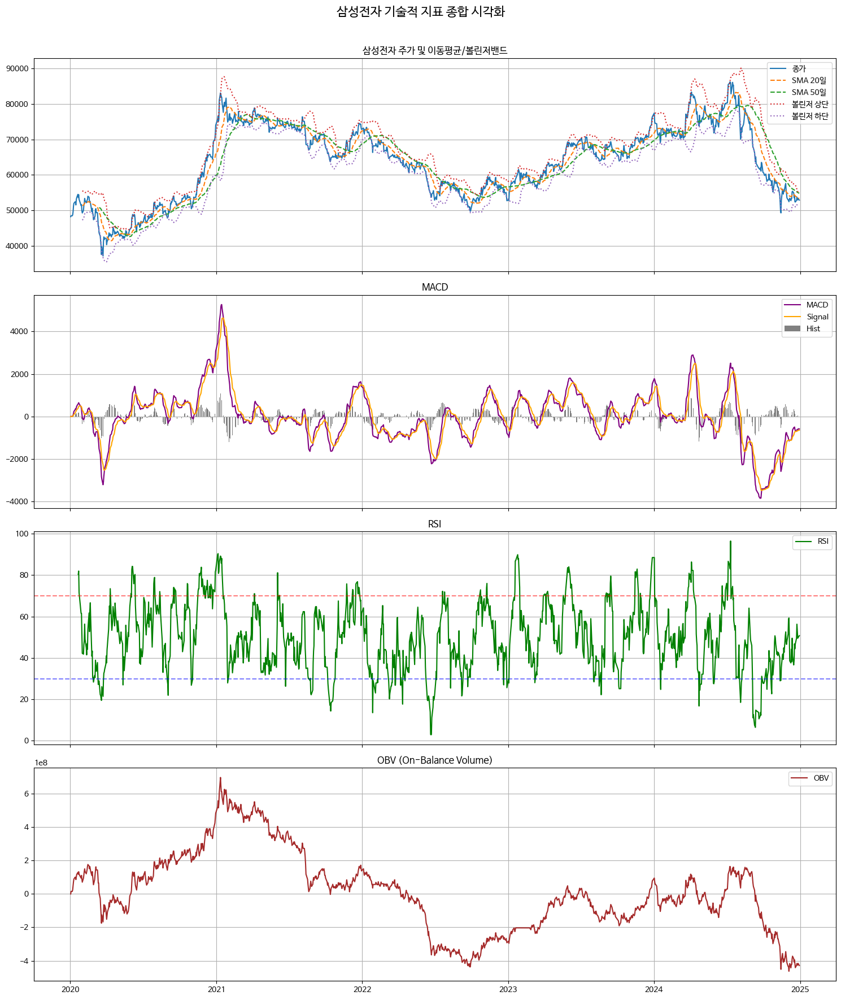


LG에너지솔루션 데이터 처리 및 시각화 중...


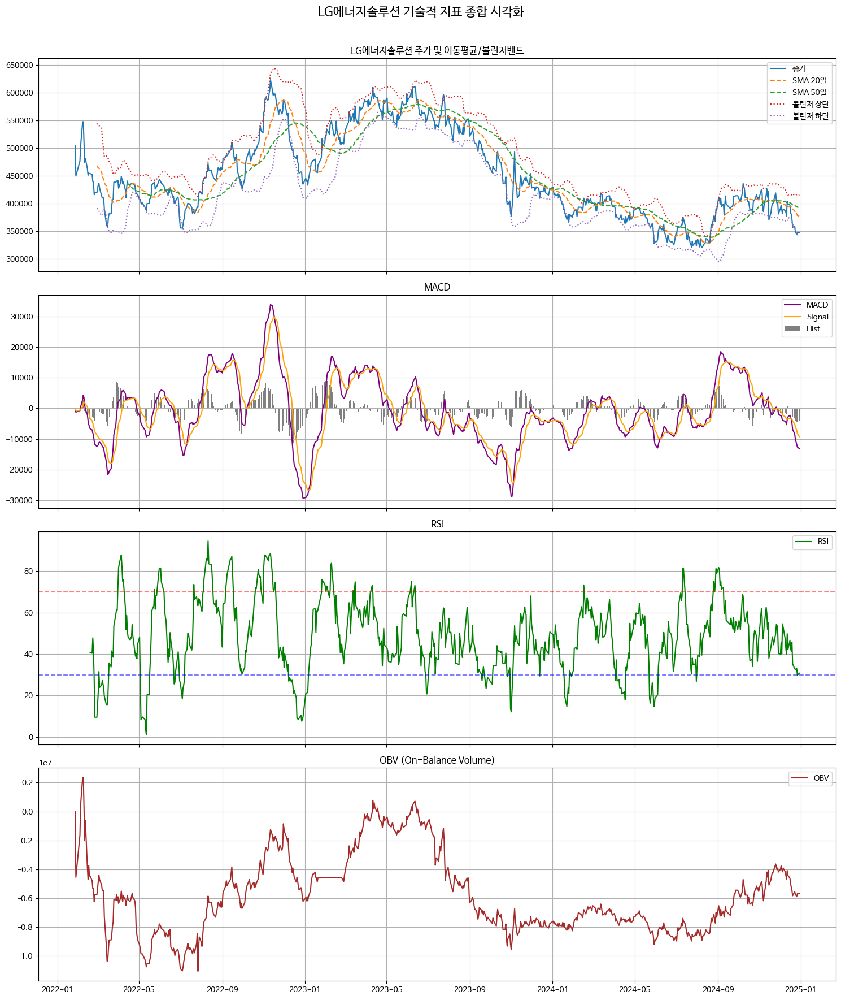


현대모비스 데이터 처리 및 시각화 중...


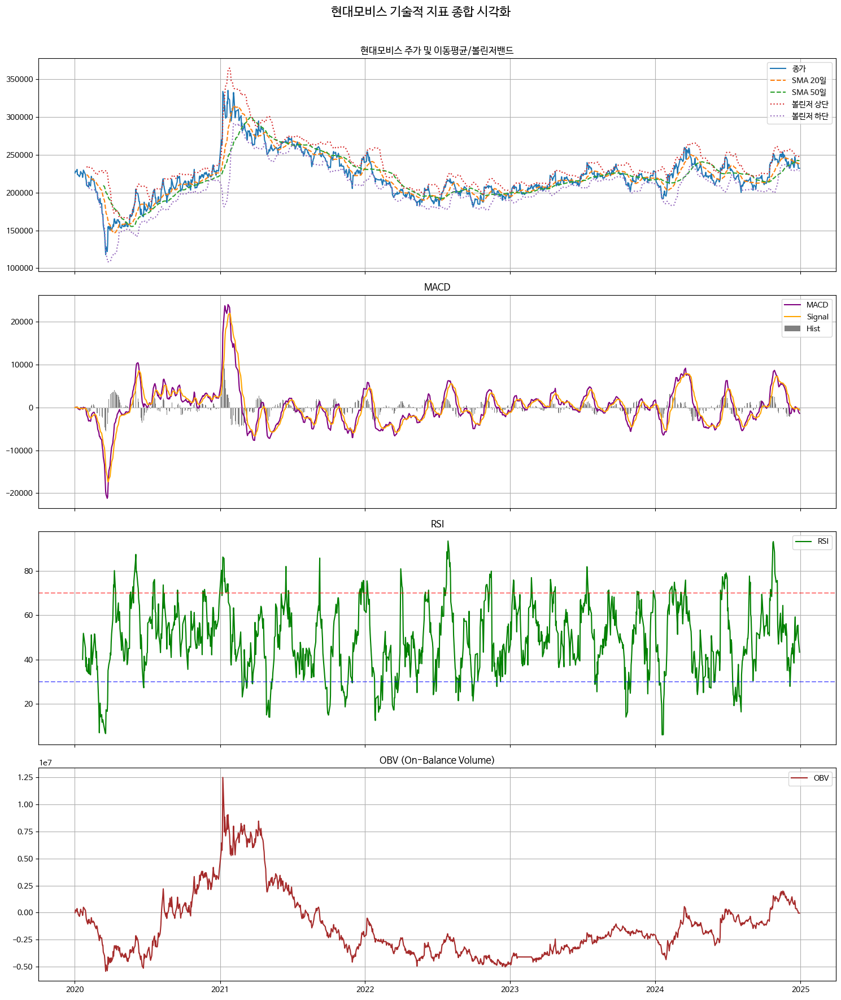


SK텔레콤 데이터 처리 및 시각화 중...


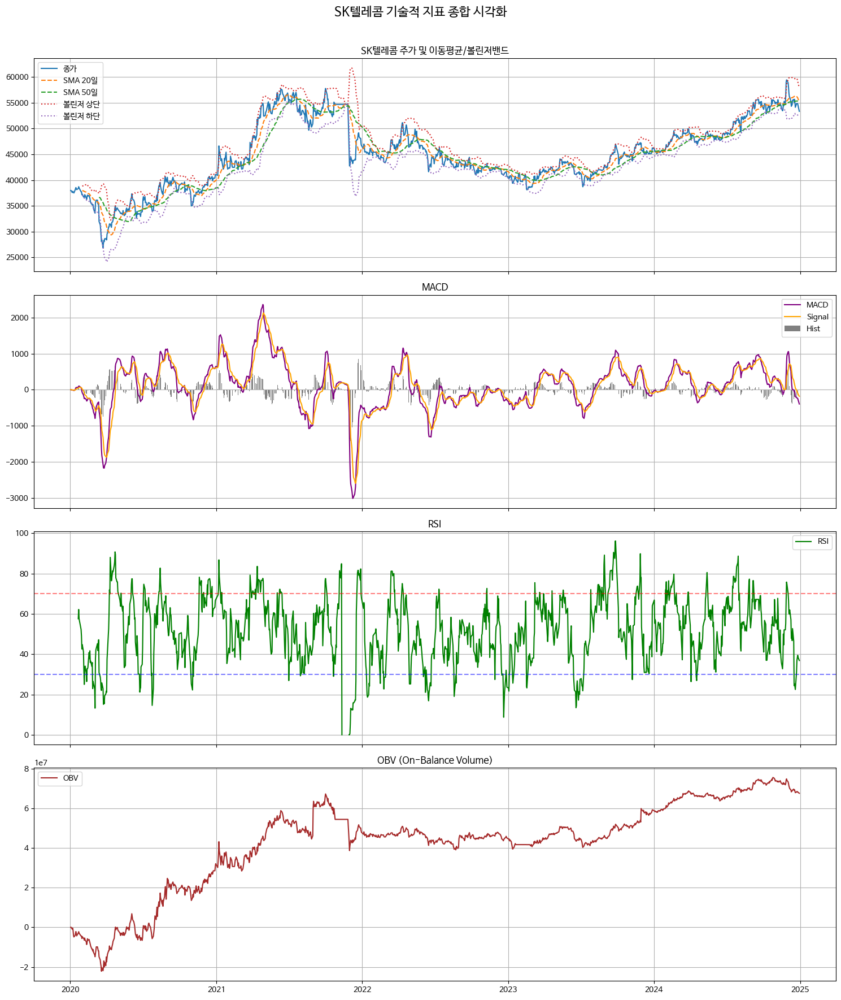


POSCO홀딩스 데이터 처리 및 시각화 중...


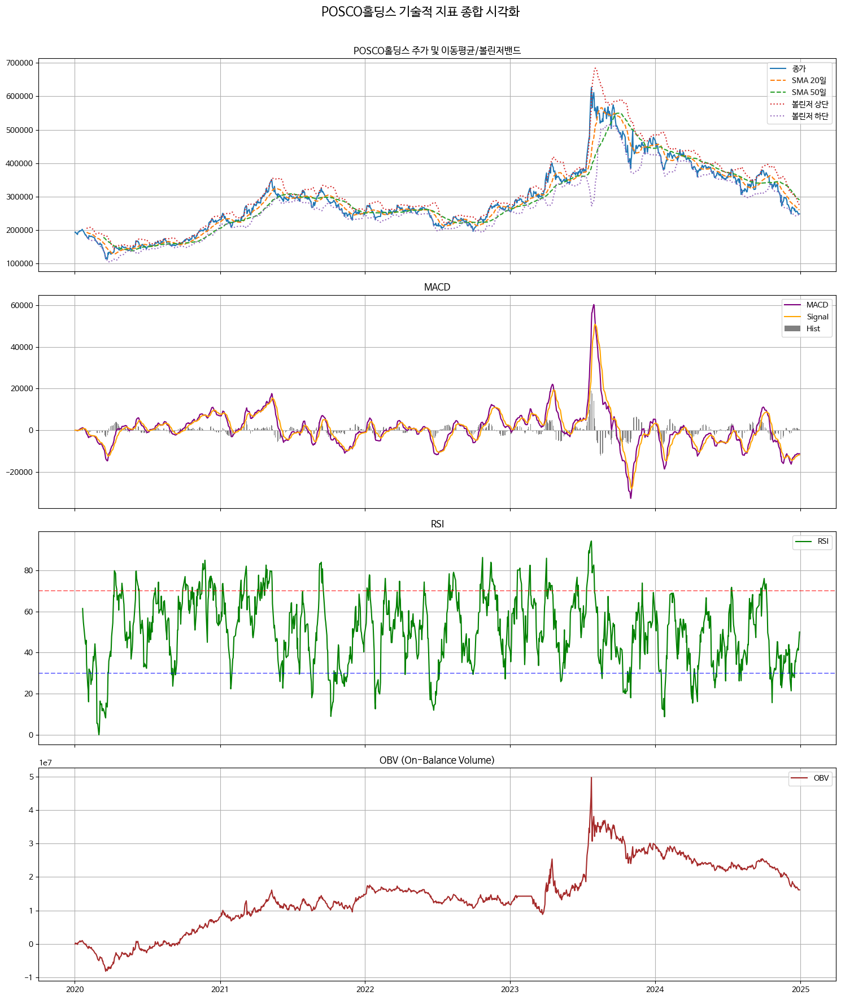


NAVER 데이터 처리 및 시각화 중...


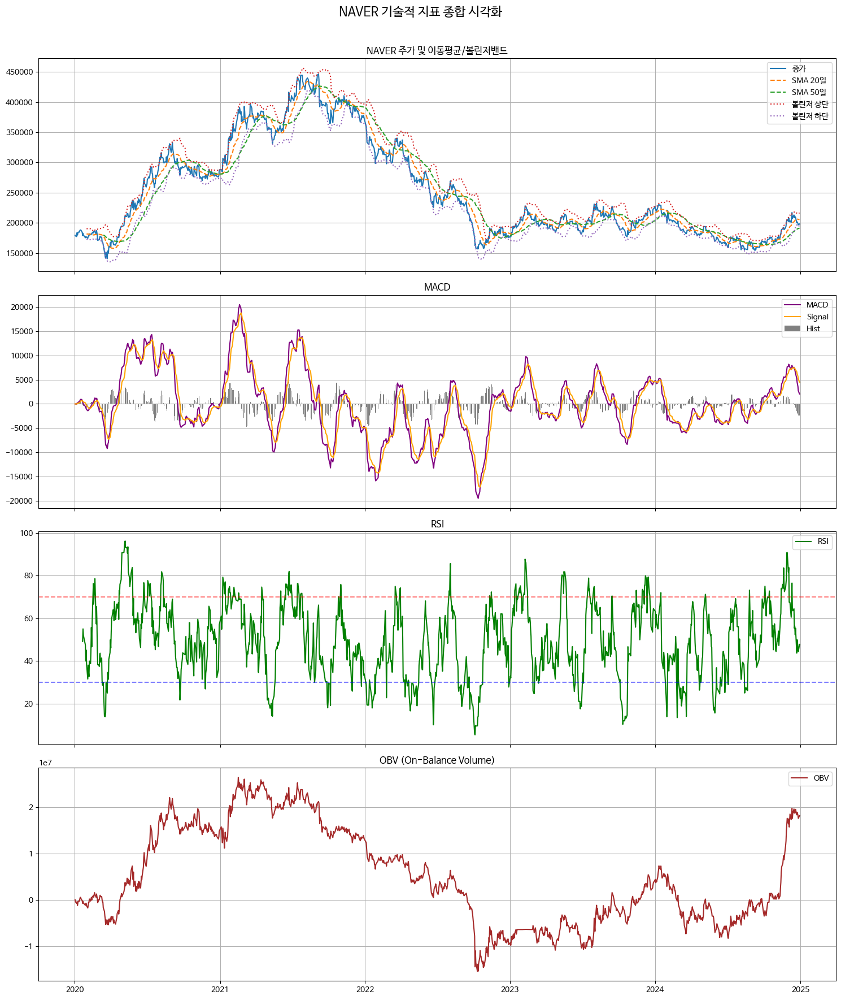


LG전자 데이터 처리 및 시각화 중...


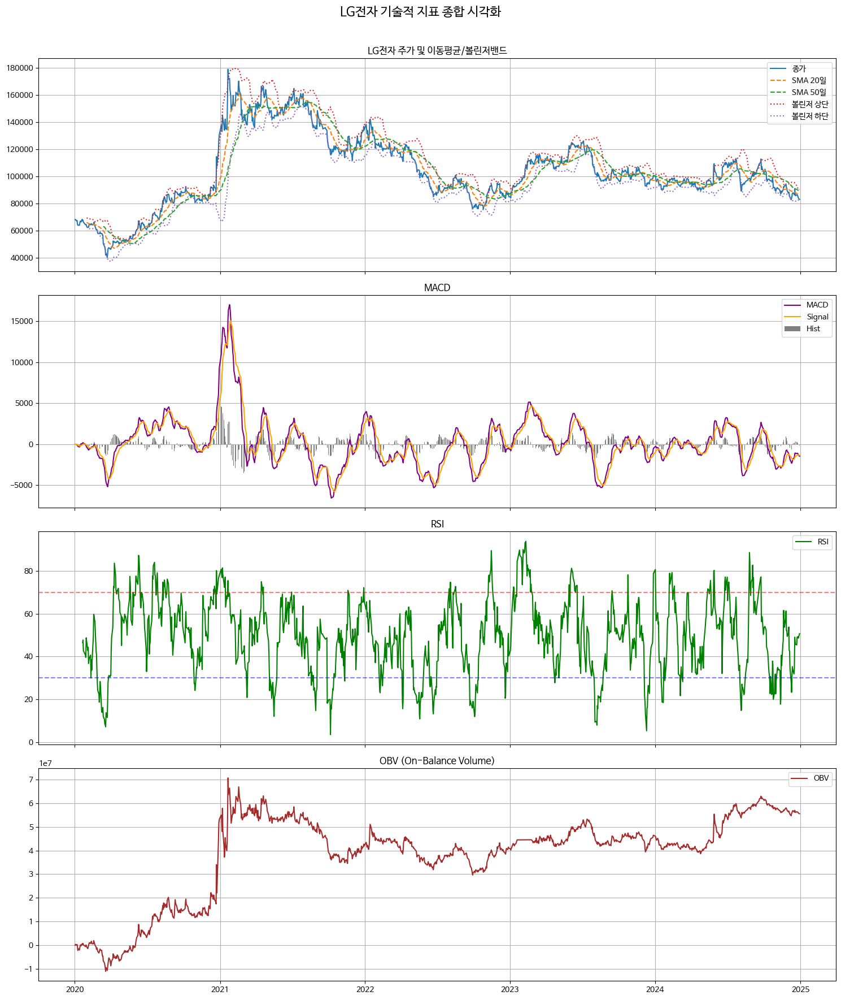


LG화학 데이터 처리 및 시각화 중...


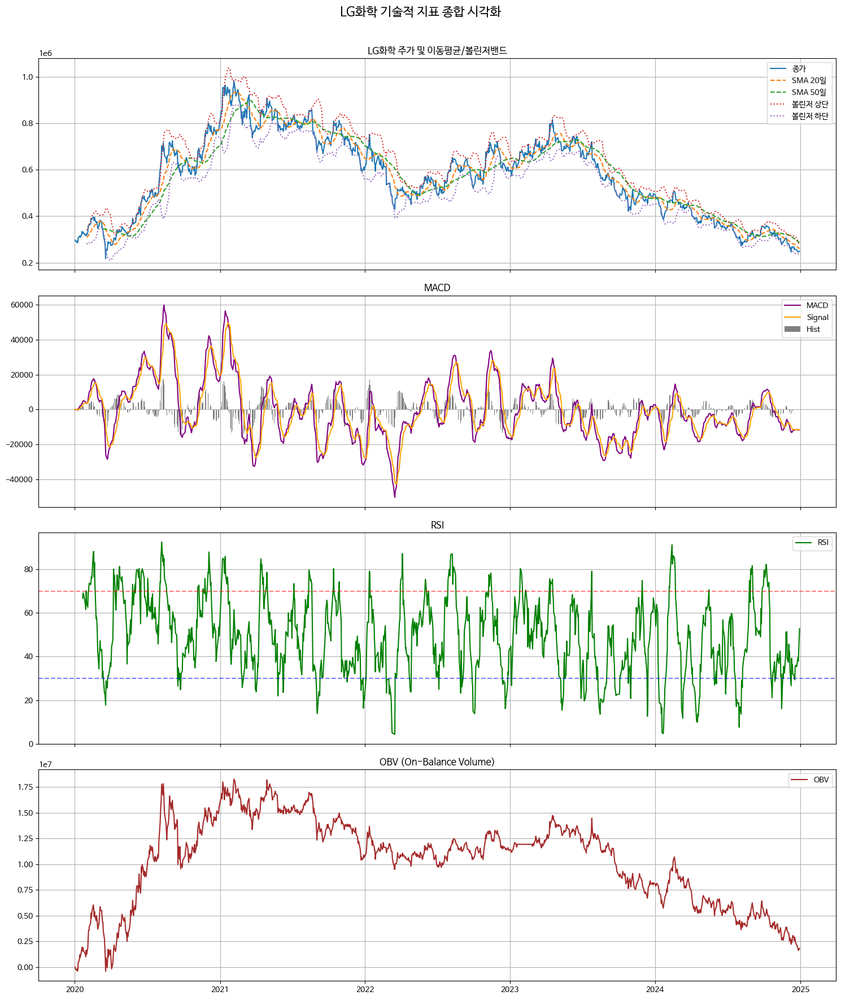


SK하이닉스 데이터 처리 및 시각화 중...


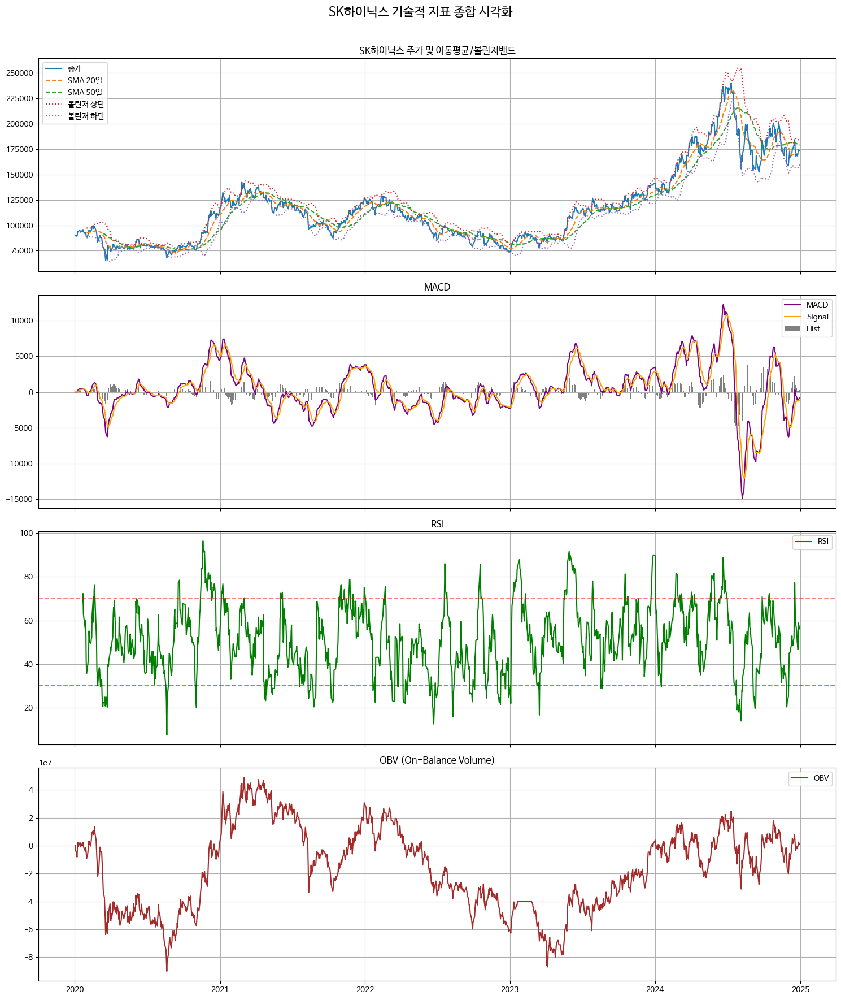


카카오 데이터 처리 및 시각화 중...


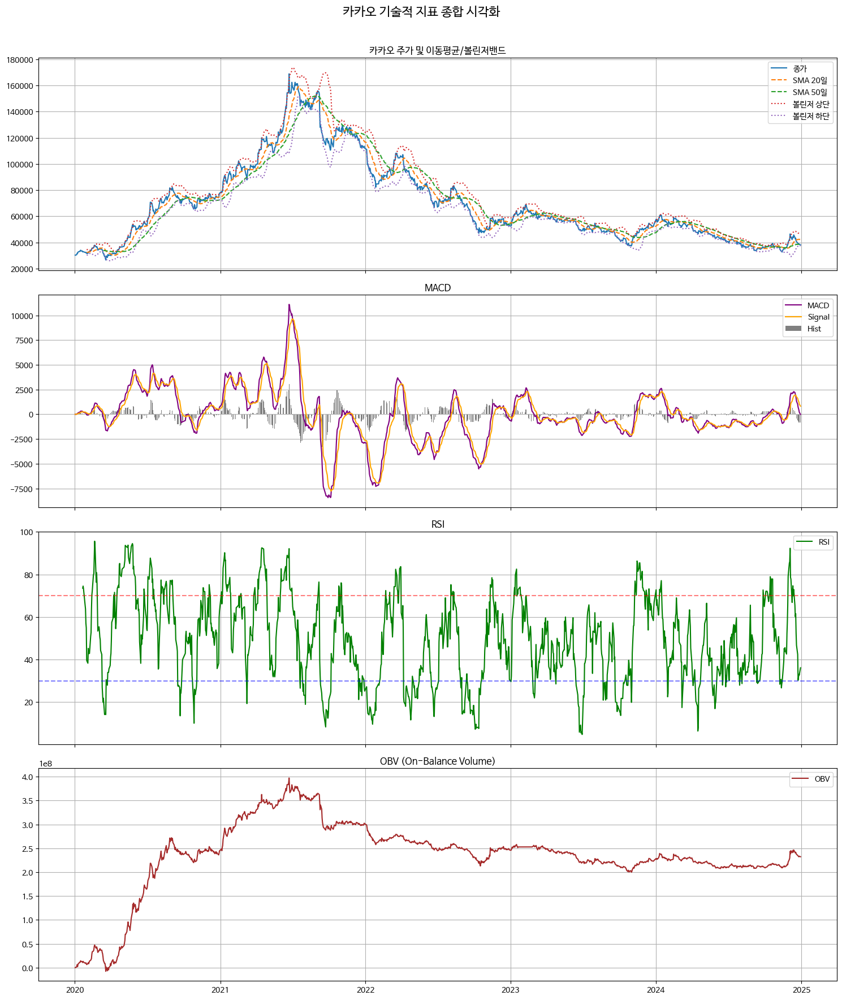


삼성SDI 데이터 처리 및 시각화 중...


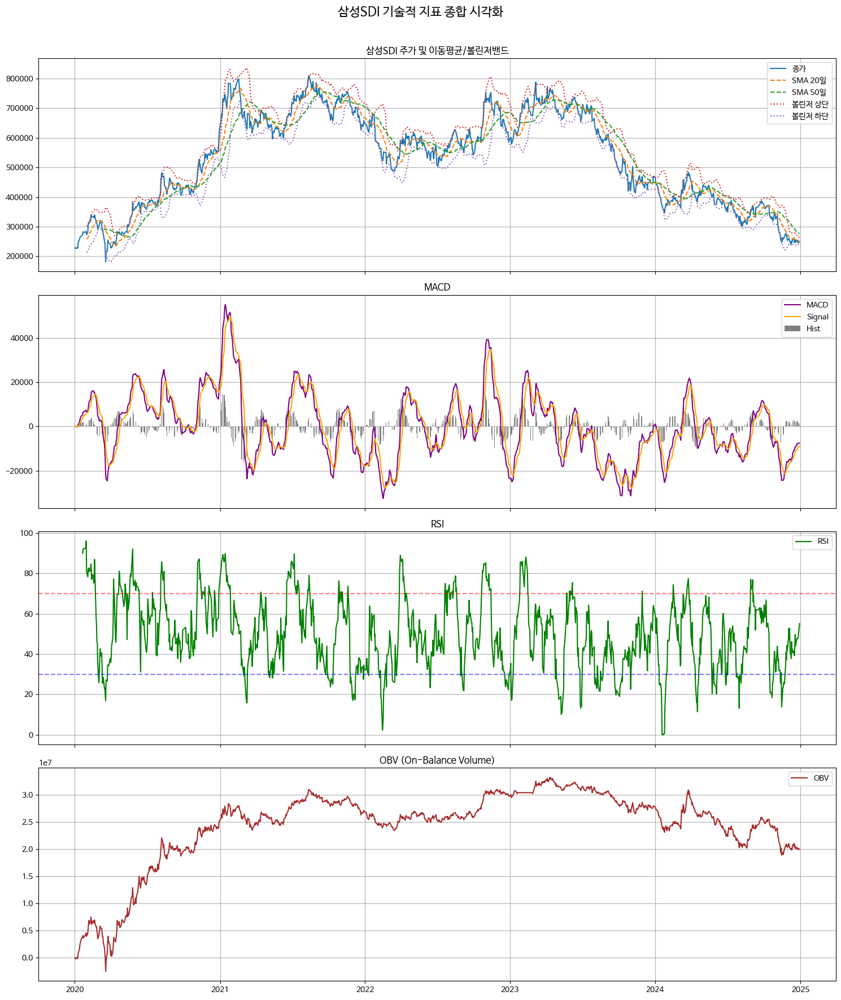


현대차 데이터 처리 및 시각화 중...


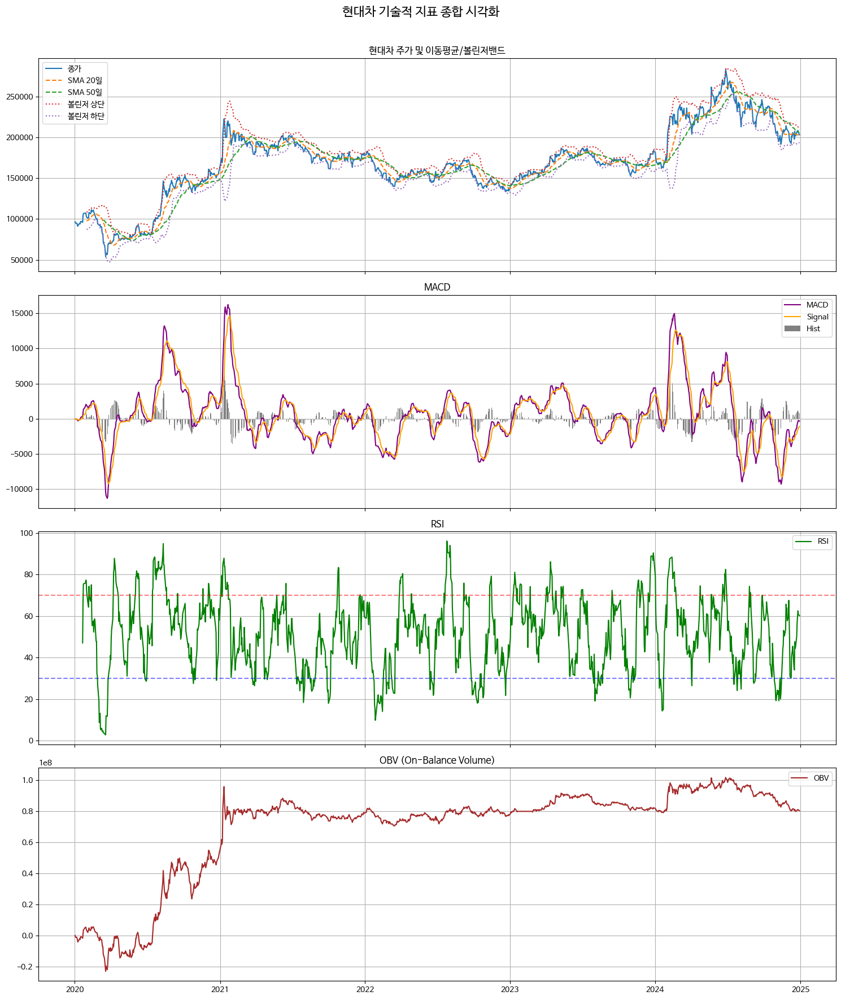


기아 데이터 처리 및 시각화 중...


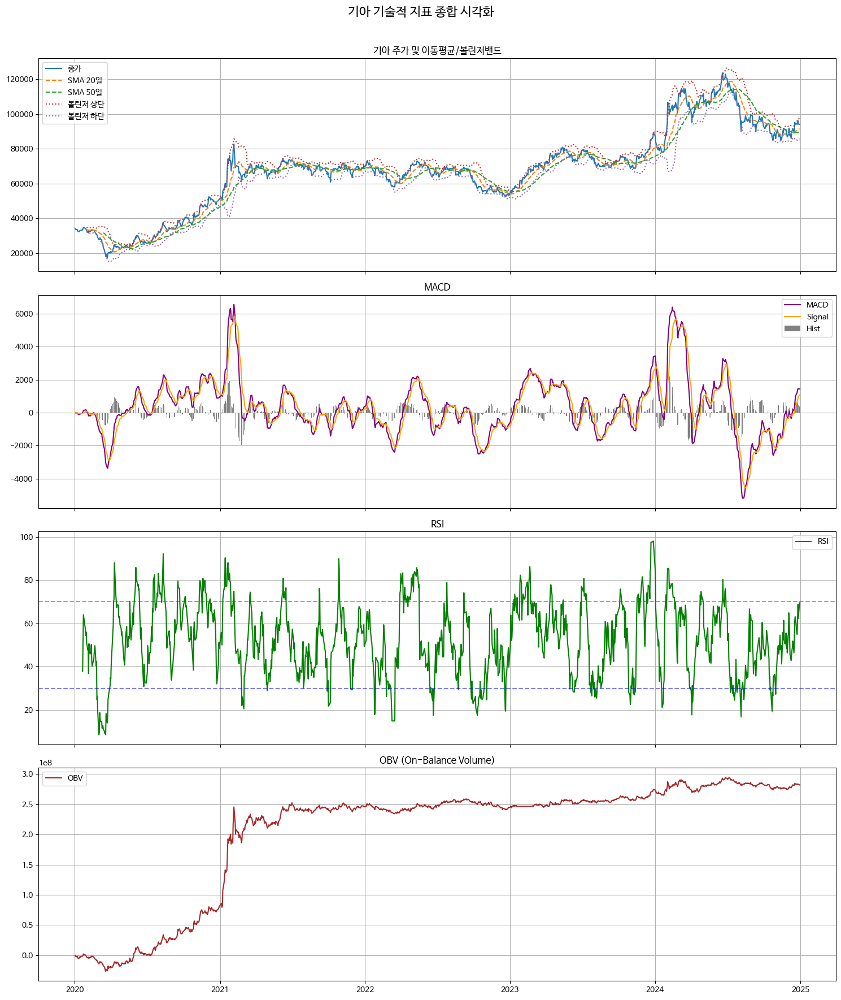


SK이노베이션 데이터 처리 및 시각화 중...


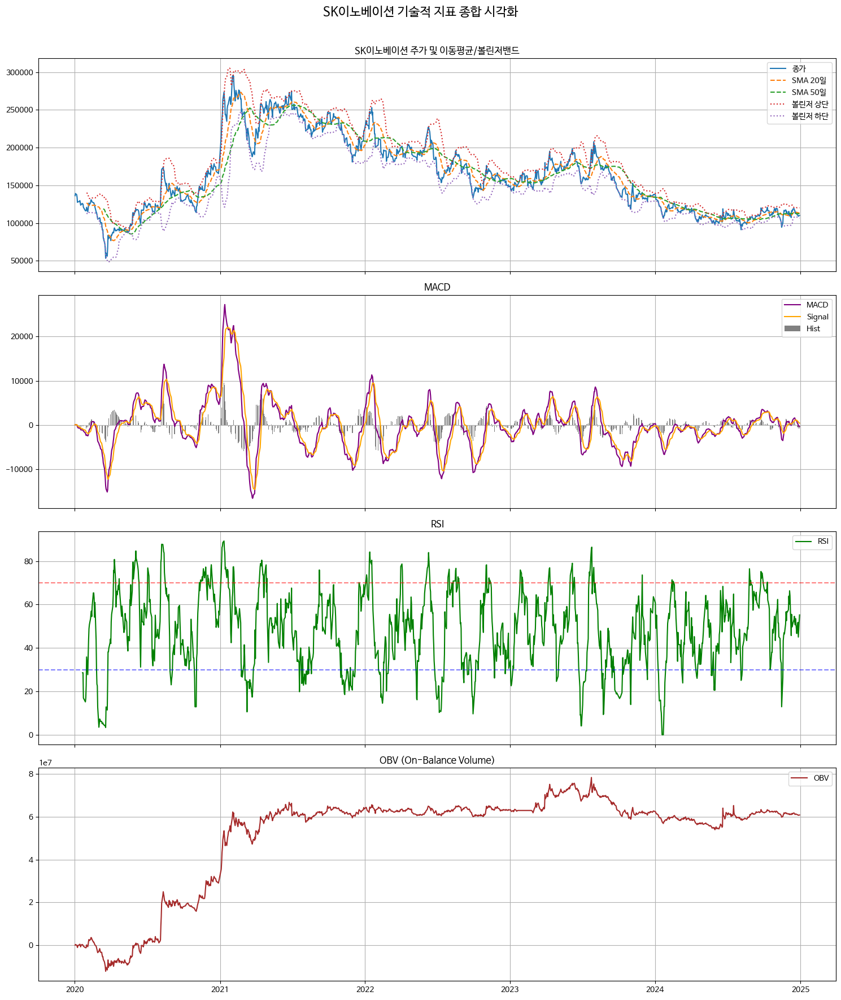


SK 데이터 처리 및 시각화 중...


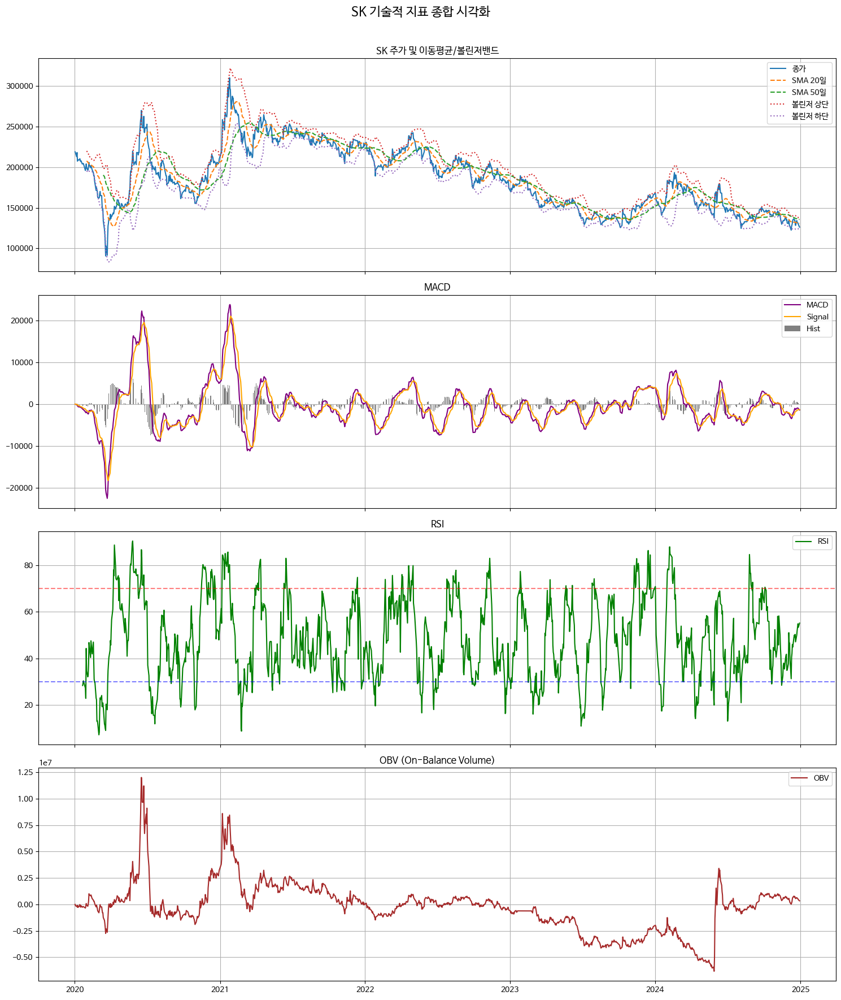


삼성물산 데이터 처리 및 시각화 중...


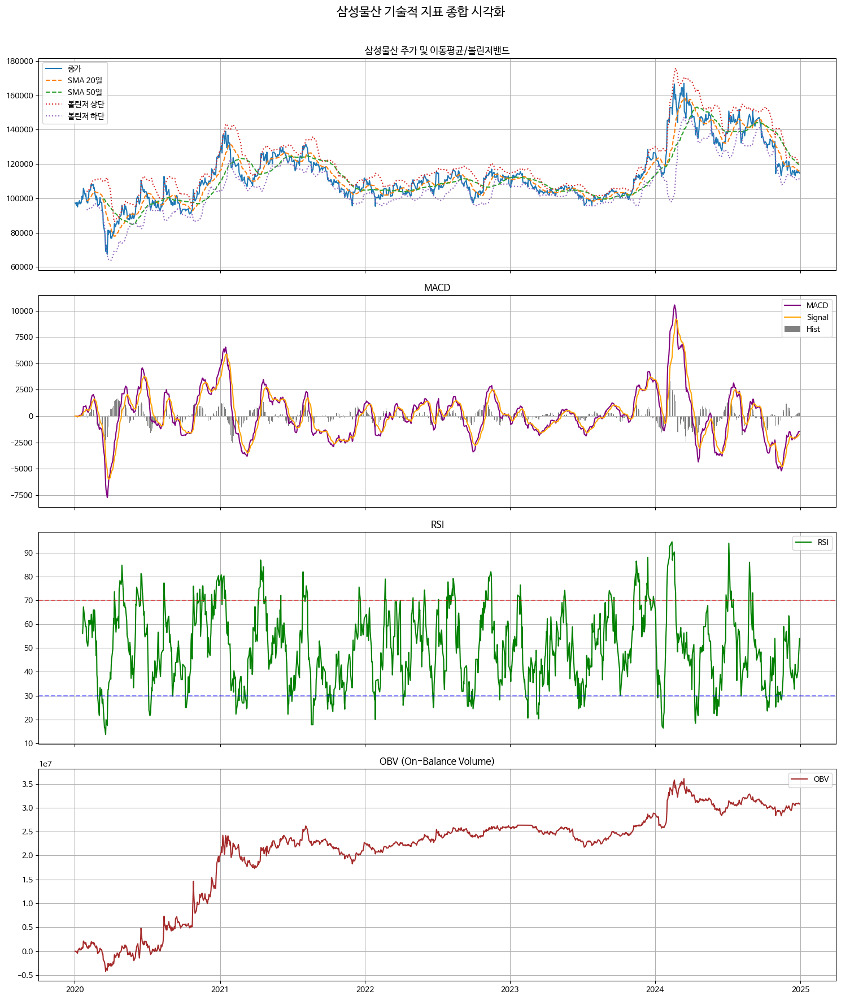


한화솔루션 데이터 처리 및 시각화 중...


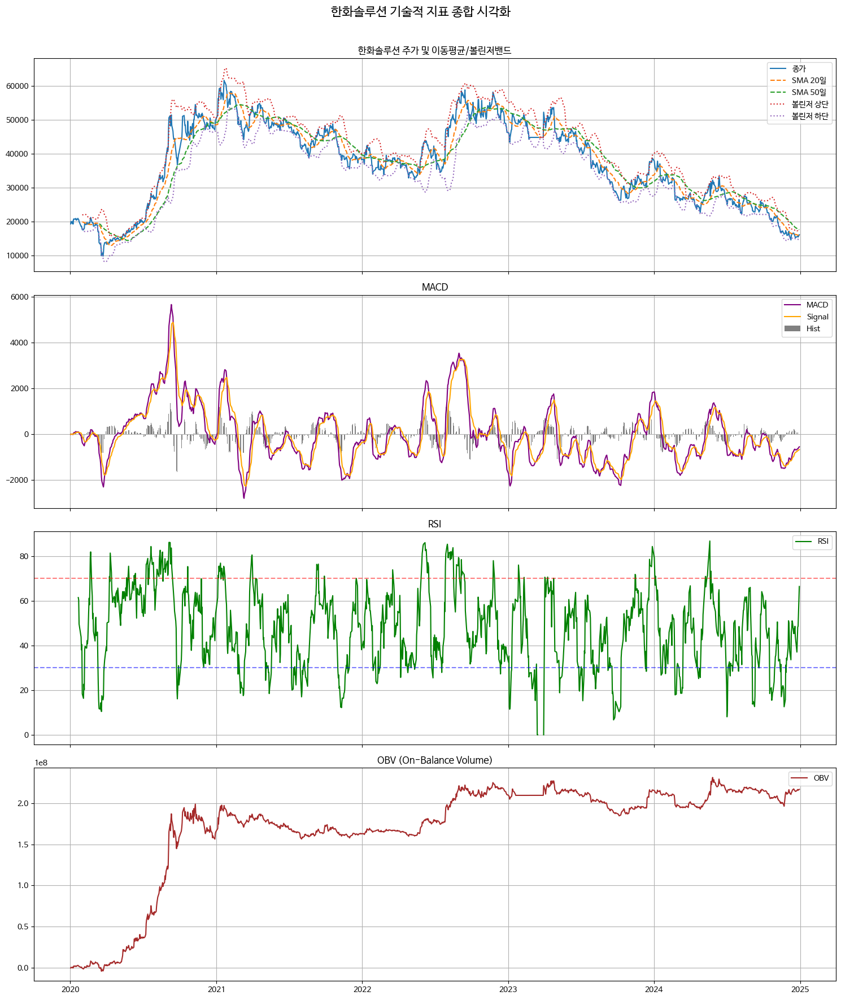


KT&G 데이터 처리 및 시각화 중...


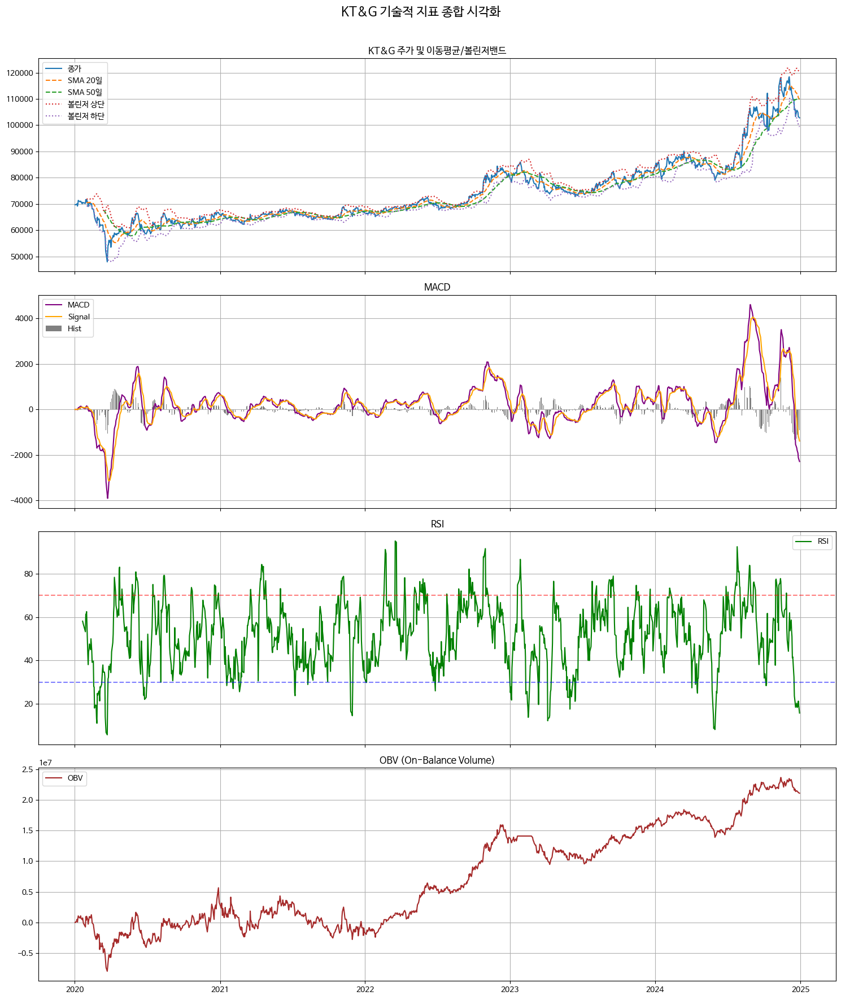


삼성생명 데이터 처리 및 시각화 중...


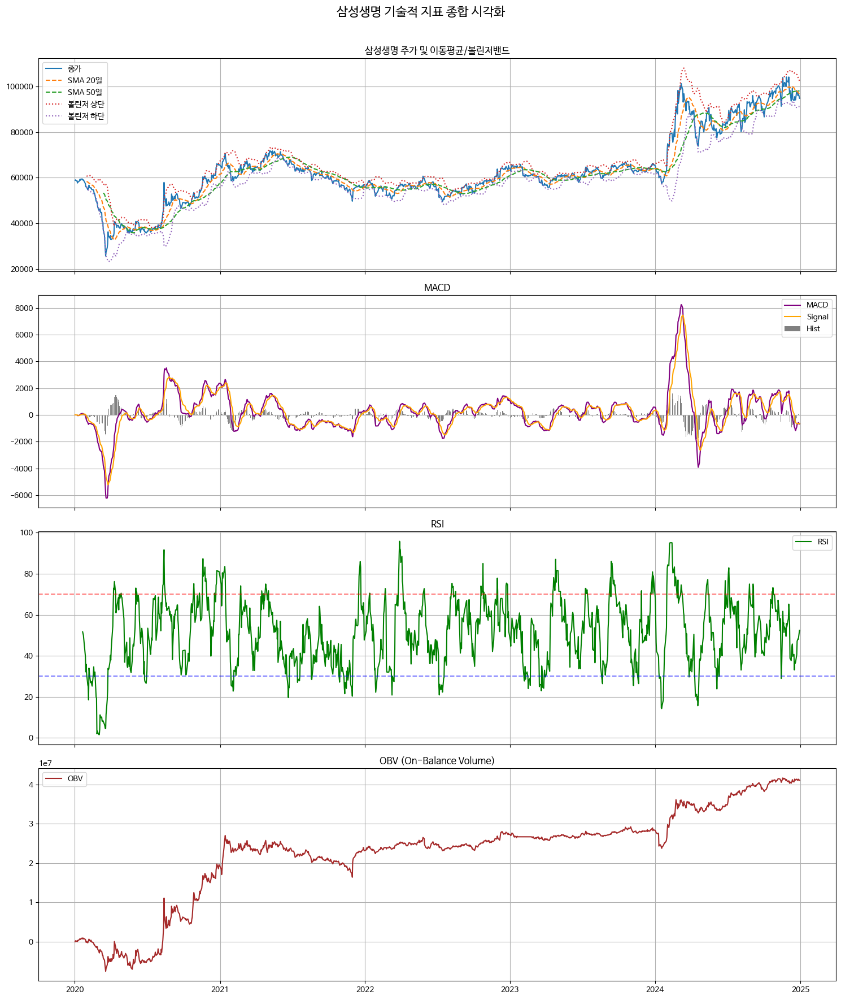


삼성화재 데이터 처리 및 시각화 중...


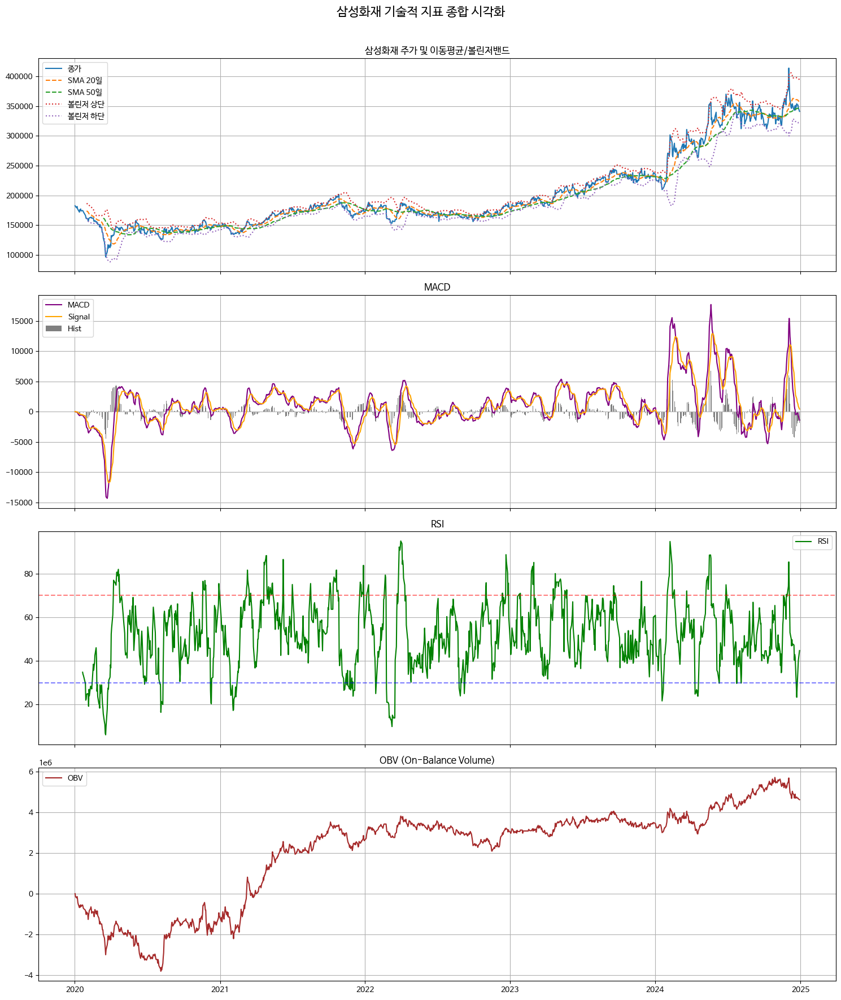


롯데케미칼 데이터 처리 및 시각화 중...


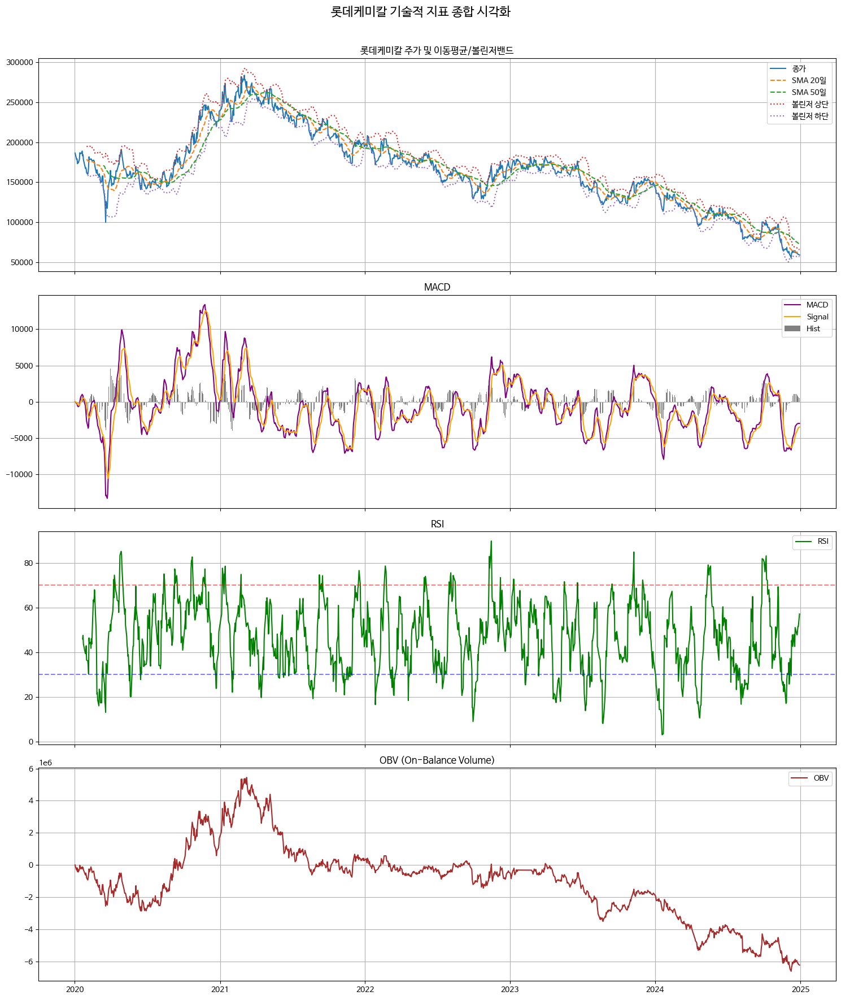


LG생활건강 데이터 처리 및 시각화 중...


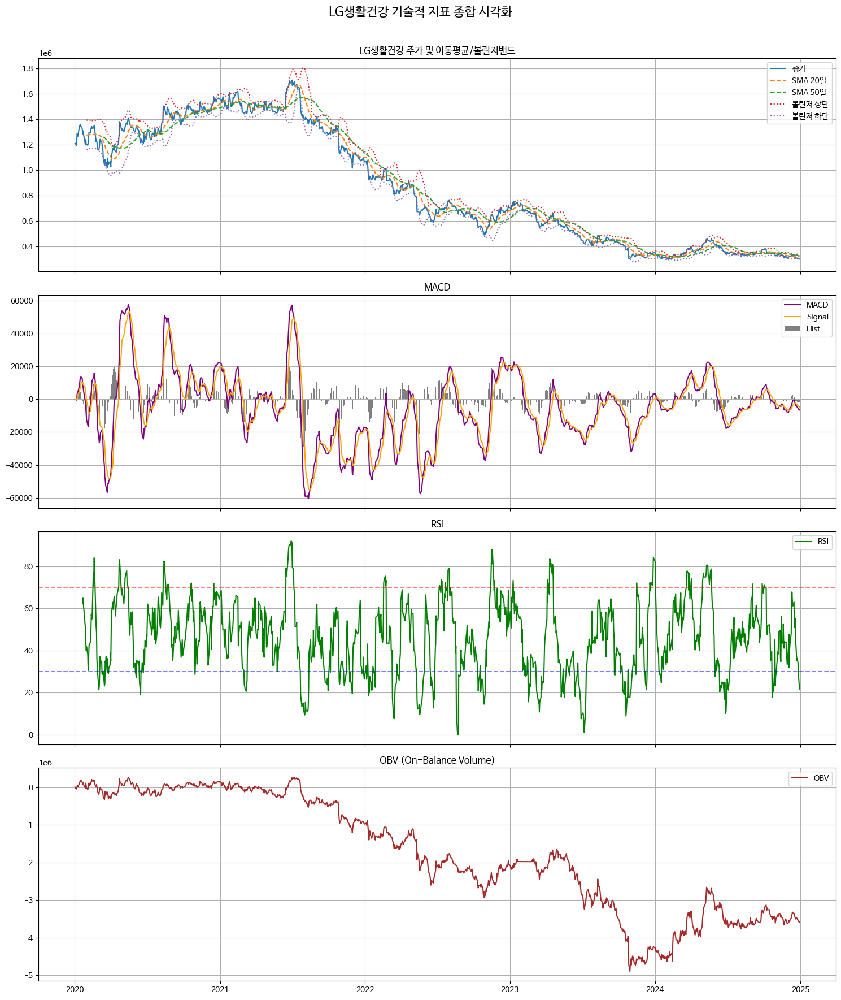


고려아연 데이터 처리 및 시각화 중...


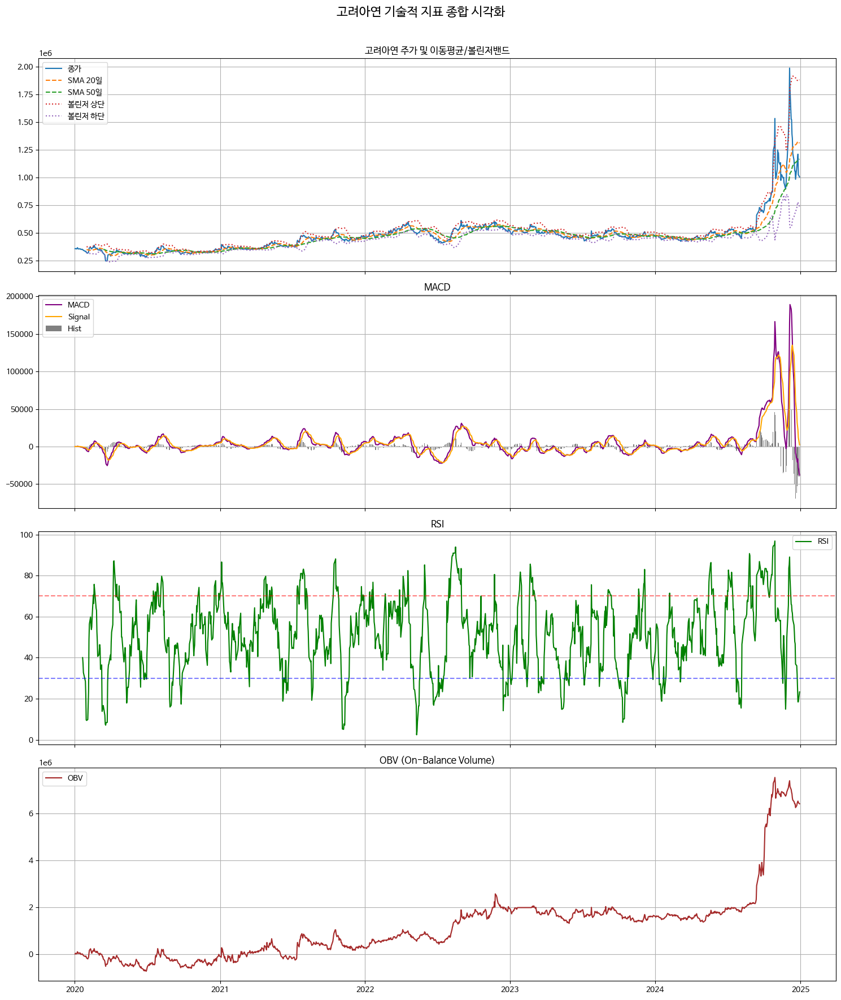


S-Oil 데이터 처리 및 시각화 중...


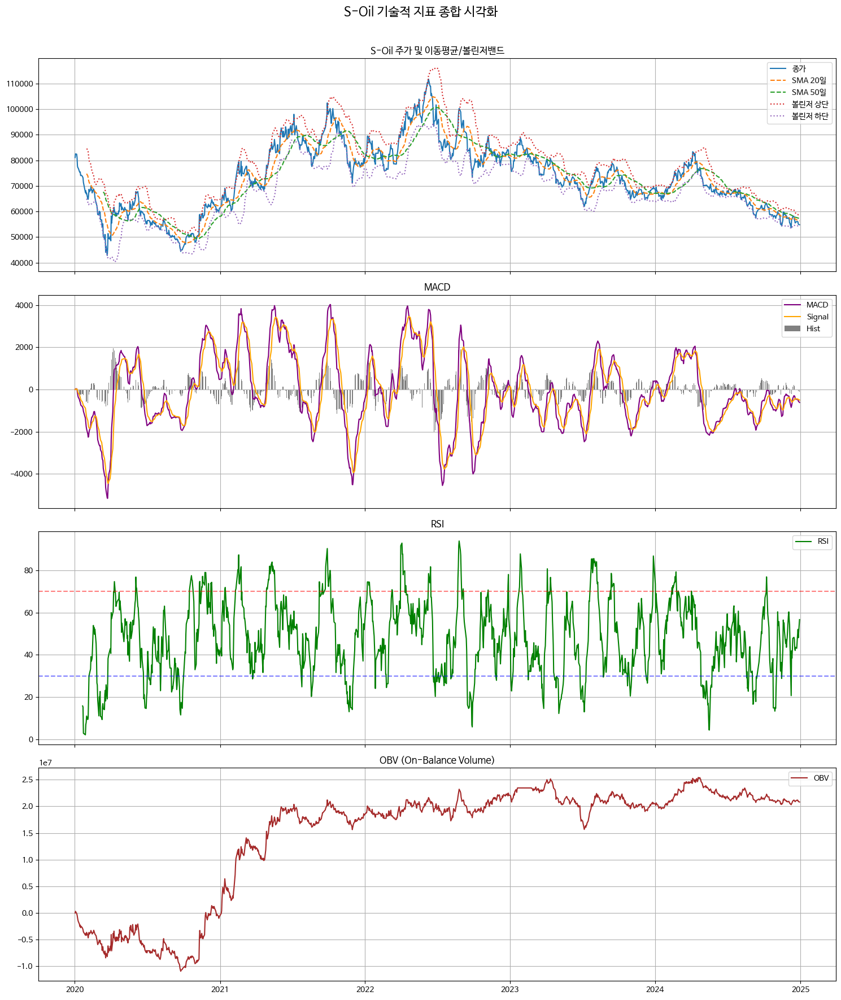


현대글로비스 데이터 처리 및 시각화 중...


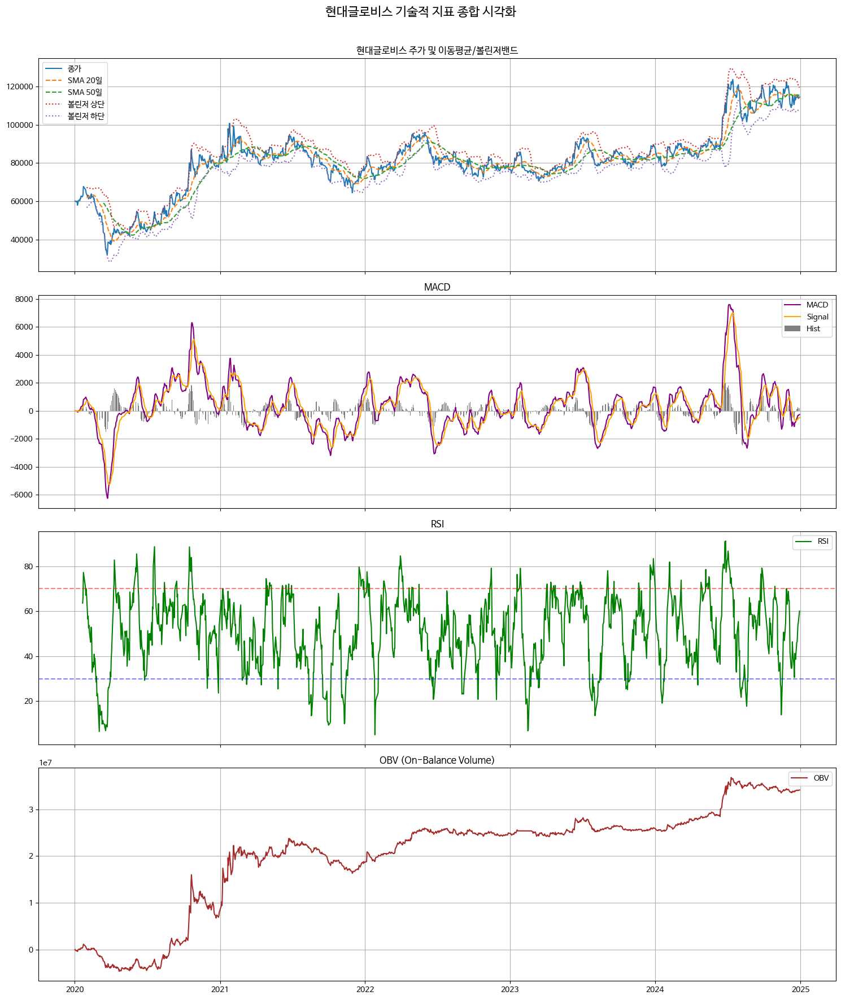


CJ제일제당 데이터 처리 및 시각화 중...


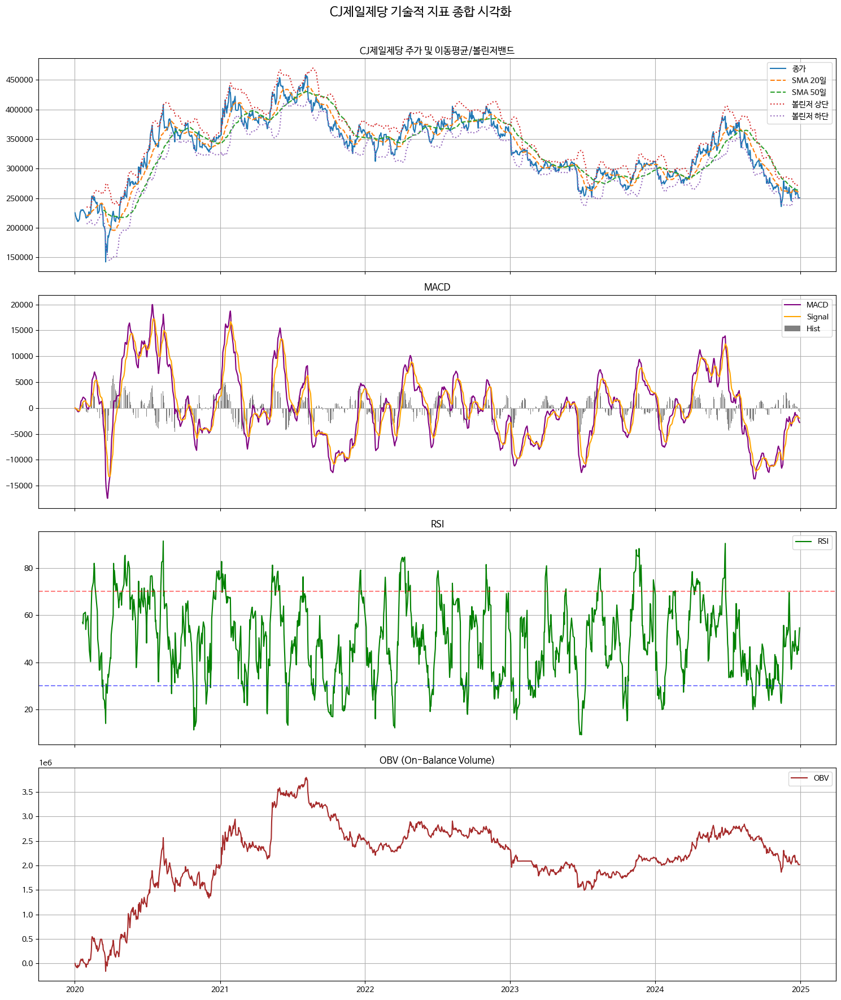


KT 데이터 처리 및 시각화 중...


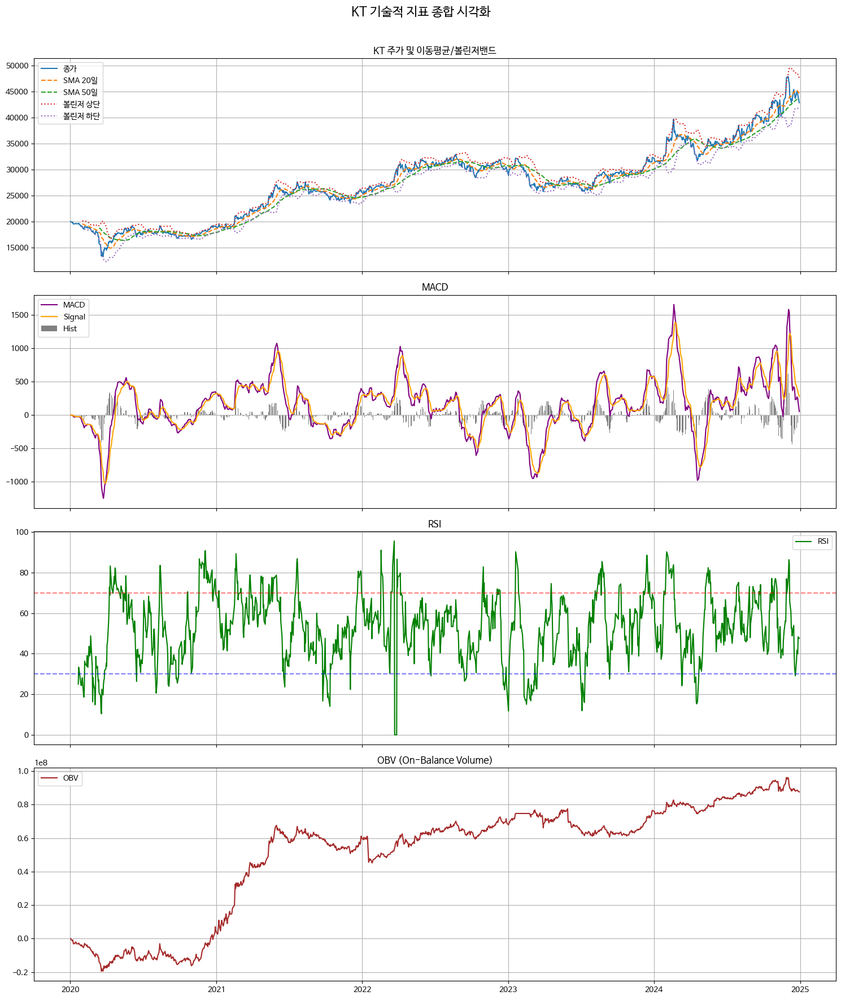


하나금융지주 데이터 처리 및 시각화 중...


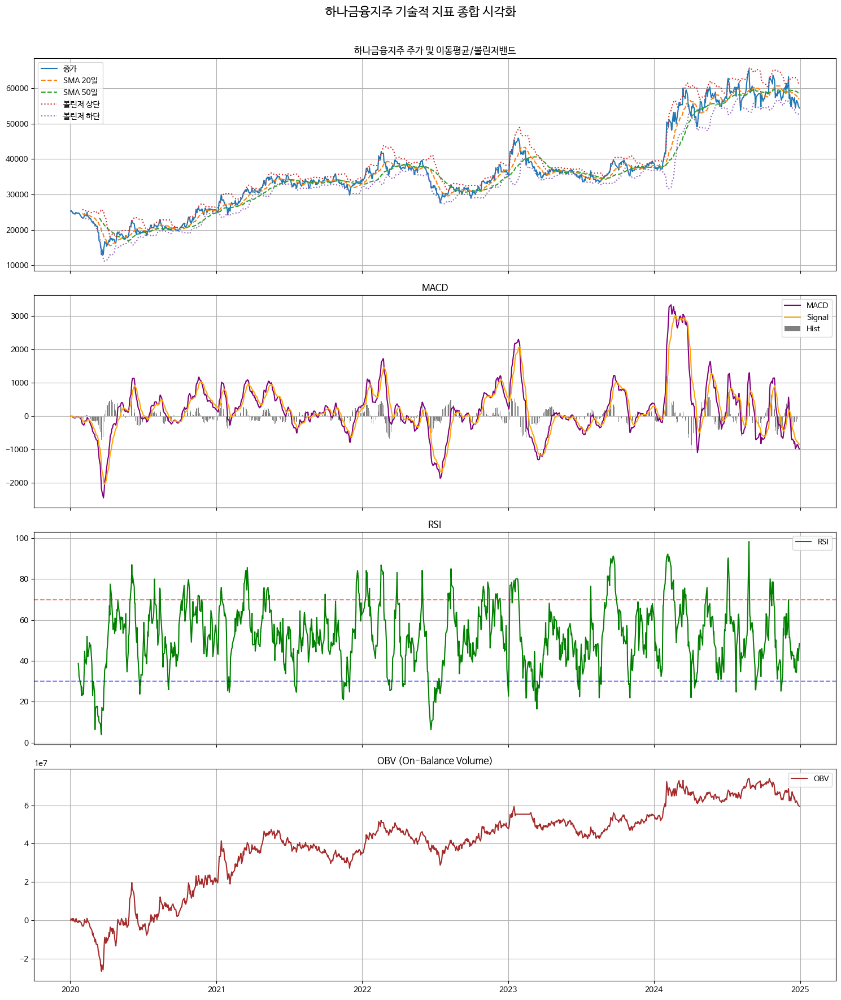


신한지주 데이터 처리 및 시각화 중...


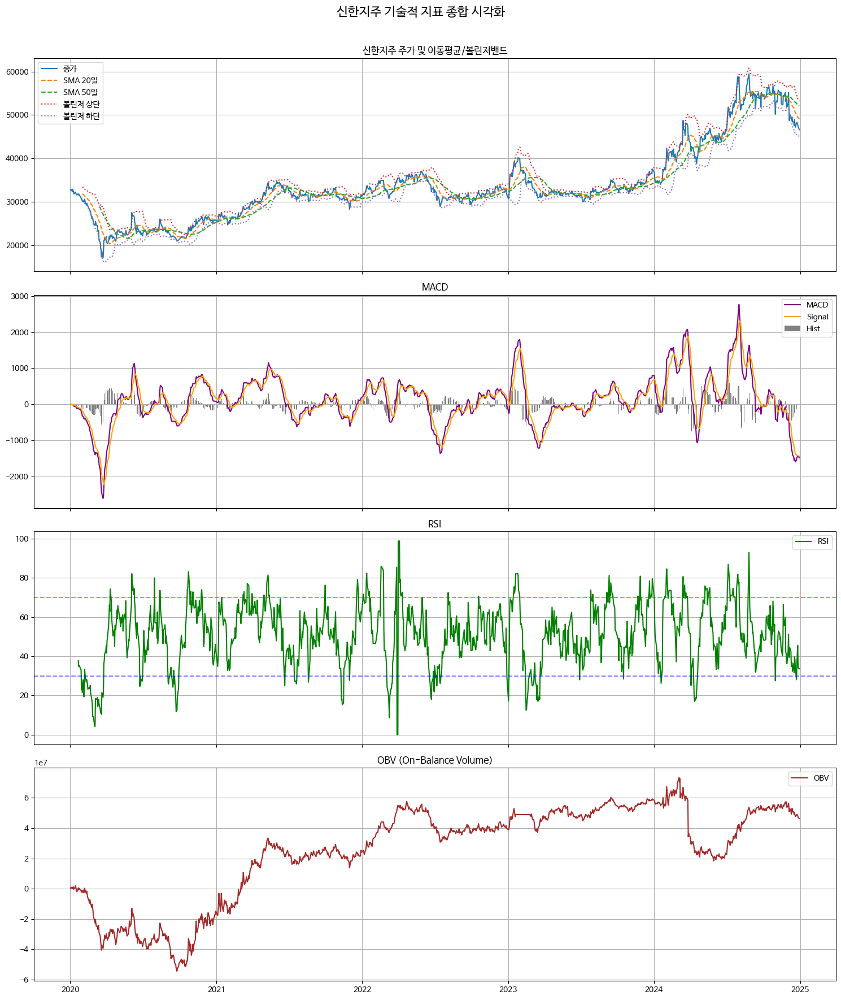


KB금융 데이터 처리 및 시각화 중...


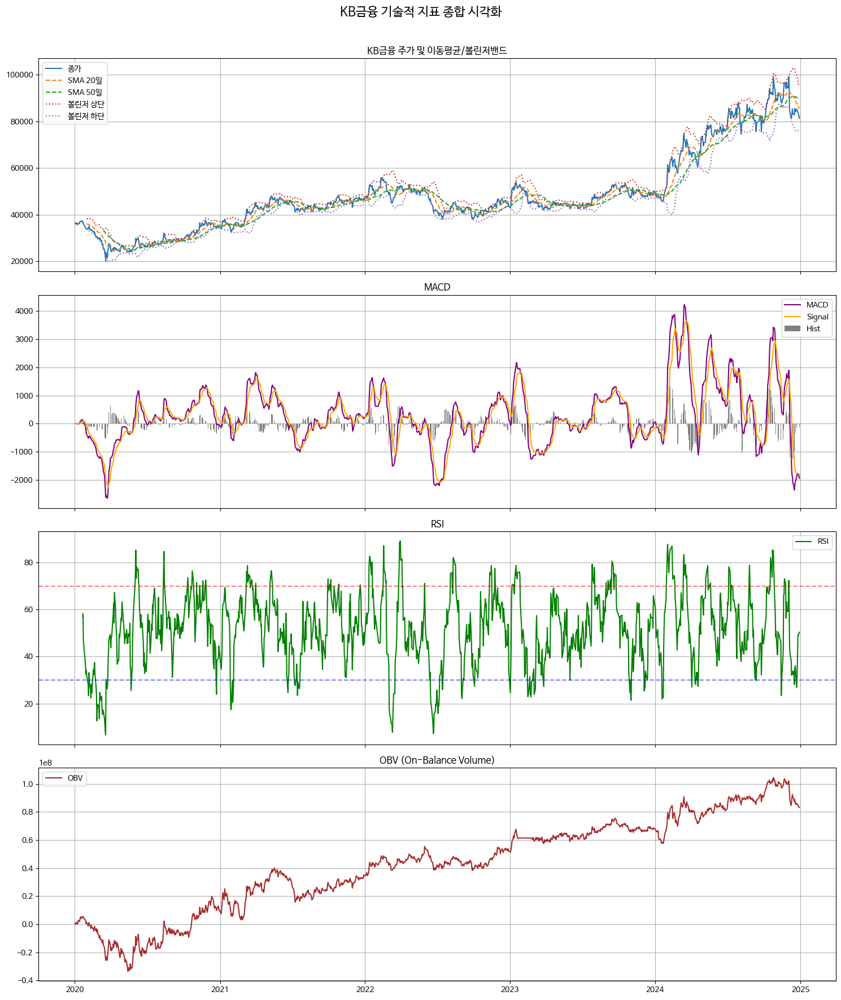

In [117]:
# 기술지표 계산 함수들
def calculate_sma(data, period): return data.rolling(window=period).mean()
def calculate_ema(data, period): return data.ewm(span=period).mean()
def calculate_macd(data, fast=12, slow=26, signal=9):
    ema_fast = calculate_ema(data, fast)
    ema_slow = calculate_ema(data, slow)
    macd = ema_fast - ema_slow
    macd_signal = calculate_ema(macd, signal)
    return macd, macd_signal, macd - macd_signal
def calculate_rsi(data, period=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0).rolling(window=period).mean()
    loss = -delta.where(delta < 0, 0).rolling(window=period).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs.replace([np.inf, -np.inf], 0)))
def calculate_obv(close, volume):
    direction = np.sign(close.diff())
    return (direction * volume).fillna(0).cumsum()
def calculate_bollinger_bands(data, period=20, std_dev=2):
    sma = calculate_sma(data, period)
    std = data.rolling(window=period).std()
    return sma + std * std_dev, sma, sma - std * std_dev

# 시각화 함수
def plot_all_technical_indicators(df, stock_name='종목명'):
    fig, axs = plt.subplots(4, 1, figsize=(15, 18), sharex=True)
    axs[0].plot(df.index, df['Close'], label='종가', linewidth=1.5)
    axs[0].plot(df.index, df['SMA_20'], label='SMA 20일', linestyle='--')
    axs[0].plot(df.index, df['SMA_50'], label='SMA 50일', linestyle='--')
    axs[0].plot(df.index, df['BB_Upper'], label='볼린저 상단', linestyle=':')
    axs[0].plot(df.index, df['BB_Lower'], label='볼린저 하단', linestyle=':')
    axs[0].set_title(f"{stock_name} 주가 및 이동평균/볼린저밴드")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(df.index, df['MACD'], label='MACD', color='purple')
    axs[1].plot(df.index, df['MACD_Signal'], label='Signal', color='orange')
    axs[1].bar(df.index, df['MACD_Hist'], label='Hist', color='gray')
    axs[1].set_title("MACD")
    axs[1].legend()
    axs[1].grid(True)

    axs[2].plot(df.index, df['RSI'], label='RSI', color='green')
    axs[2].axhline(70, color='red', linestyle='--', alpha=0.5)
    axs[2].axhline(30, color='blue', linestyle='--', alpha=0.5)
    axs[2].set_title("RSI")
    axs[2].legend()
    axs[2].grid(True)

    axs[3].plot(df.index, df['OBV'], label='OBV', color='brown')
    axs[3].set_title("OBV (On-Balance Volume)")
    axs[3].legend()
    axs[3].grid(True)

    plt.suptitle(f"{stock_name} 기술적 지표 종합 시각화", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# 기술지표 전체 계산
def calculate_all_technical_indicators(df):
    df['SMA_20'] = calculate_sma(df['Close'], 20)
    df['SMA_50'] = calculate_sma(df['Close'], 50)
    df['BB_Upper'], df['BB_Middle'], df['BB_Lower'] = calculate_bollinger_bands(df['Close'])
    df['MACD'], df['MACD_Signal'], df['MACD_Hist'] = calculate_macd(df['Close'])
    df['RSI'] = calculate_rsi(df['Close'])
    df['OBV'] = calculate_obv(df['Close'], df['Volume'])
    return df


# 실행 함수 수정
def process_and_plot_all_stocks():
    # download_korean_stocks 함수를 호출하여 모든 주식 데이터 가져오기
    stock_data = download_korean_stocks()

    if not stock_data:
        print("다운로드된 주식 데이터가 없어 시각화를 건너뜝니다.")
        return

    # 다운로드된 stock_data 딕셔너리의 키(주식 이름)를 사용하여 반복
    for name, data in stock_data.items():

        # KOSPI 지수 데이터는 기술 지표 계산 및 개별 종목 차트에서 제외 (필요시 조정)
#        if name == 'KOSPI':
#             print(f"\n{name}는 시각화에서 제외합니다.")
#             continue

        try:
            print(f"\n{name} 데이터 처리 및 시각화 중...")
            if data.empty:
                print(f"{name}: 데이터 없음. 시각화 건너뜀.")
                continue

            # 기술 지표 계산
            df = calculate_all_technical_indicators(data)

            # 시각화 함수 호출
            plot_all_technical_indicators(df, stock_name=name)

        except Exception as e:
            print(f"{name} 처리 또는 시각화 실패: {e}")

# 실행
# process_and_plot_all_stocks() # 주석 처리하여 메인 실행부에서 호출되도록 합니다.

# 주의: 이 코드는 download_korean_stocks, calculate_all_technical_indicators,
# plot_all_technical_indicators 함수가 동일한 스크립트/셀에 정의되어 있거나
# import되어 사용 가능하다고 가정합니다.


# 실행
process_and_plot_all_stocks()


이제 코드 전체 흐름을 다음처럼 따라갈 수 있습니다:

1. 데이터 준비 및 종가 추출 (prepare_ica_analysis)

2. 수익률 계산 및 ICA 분석 (calculate_returns_and_ica)

3. ICA 성분을 통한 재구성 및 시각화 (evaluate_common_ica_reconstruction, plot_ica_reconstruction_error)

4. 재구성 오차 기반 피처 생성 및 통합

5. 최종 결과 저장 (ica_features_for_model.csv)

StandardScaler는 whitening은 하지 않음

Whitening = 단순 표준화 + 공분산 제거 입니다:

단순히 각 변수의 분산을 1로 맞추는 것뿐만 아니라,

변수 간의 상관관계를 없애기 위한 직교변환을 포함합니다.

보통 PCA 기반 whitening을 의미합니다.

In [128]:


# 1. 데이터 준비
def prepare_ica_analysis(combined_df):
    print("🔍 ICA 분석을 위한 데이터 준비 중...")

    stocks = combined_df['Stock_Name'].unique()
    price_fields = ['Close', 'Open', 'High', 'Low', 'Volume']
    price_data = {field: {} for field in price_fields}

    for stock in stocks:
        stock_data = combined_df[combined_df['Stock_Name'] == stock].copy()
        stock_data = stock_data.sort_values('Date')
        stock_data.set_index('Date', inplace=True)
        for field in price_fields:
            price_data[field][stock] = stock_data[field]

    price_df = {field: pd.DataFrame(price_data[field]) for field in price_fields}
    close_df = price_df['Close'].dropna()

    print(f"종가 데이터 형태: {close_df.shape}")
    return price_df, close_df

# 2. ICA 계산 (정규화 추가됨)
def calculate_returns_and_ica(close_df):
    # 👉 ICA 적용 전 정규화 (center + scale)
    scaler = StandardScaler()
    scaled_close = pd.DataFrame(
        scaler.fit_transform(close_df),
        index=close_df.index,
        columns=close_df.columns
    )

    # 수익률 계산
    returns = np.log(close_df / close_df.shift(1)).dropna()

    n_stocks = close_df.shape[1]
    # 아래 코드 (n_components=n_stocks)
    # IC의 개수 = 종가 데이터의 종목 수 = 30개

    # 종가 ICA (정규화된 종가 사용)
    model_price = FastICA(n_components=n_stocks, random_state=42, max_iter=1000)
    common_ic_price = model_price.fit_transform(scaled_close.loc[returns.index])

    # 수익률 ICA (raw 수익률 사용)
    model_return = FastICA(n_components=n_stocks, random_state=42, max_iter=1000)
    common_ic_return = model_return.fit_transform(returns)

    # 역변환 위한 scaler도 함께 반환 (추후 재구성 원스케일 복원 가능)
    return returns, common_ic_price, common_ic_return, model_price, model_return, scaler


def calculate_returns_and_ica(close_df):
    returns = np.log(close_df / close_df.shift(1)).dropna()
    n_stocks = close_df.shape[1]

    model_price = FastICA(n_components=n_stocks, random_state=42, max_iter=1000)
    common_ic_price = model_price.fit_transform(close_df.loc[returns.index])

    model_return = FastICA(n_components=n_stocks, random_state=42, max_iter=1000)
    common_ic_return = model_return.fit_transform(returns)

    return returns, common_ic_price, common_ic_return, model_price, model_return

# 3. 공통 ICA 재구성 평가
def evaluate_common_ica_reconstruction(data, model, ica_components, label_prefix="Common"):
    reconstructed = np.dot(ica_components, model.mixing_.T)
    mse = mean_squared_error(data.values, reconstructed)
    mae = mean_absolute_error(data.values, reconstructed)
    print(f"  {label_prefix} ICA MSE = {mse:.6f}, MAE = {mae:.6f}")
    return mse, mae

# 4. 피처 병합 (종목/날짜 단위 반복)
def merge_all_features(combined_df, returns, common_ic_price, common_ic_return):
    index = returns.index
    stocks = returns.columns

    common_ic_price_df = pd.DataFrame(common_ic_price, index=index, columns=[f"CommonIC_Price_{i}" for i in range(common_ic_price.shape[1])])
    common_ic_return_df = pd.DataFrame(common_ic_return, index=index, columns=[f"CommonIC_Return_{i}" for i in range(common_ic_return.shape[1])])

    merged_rows = []
    for date in index:
        for stock in stocks:
            row = {
                'Date': date,
                'Stock_Name': stock,
                'Return': returns.loc[date, stock],
            }
            for col in common_ic_price_df.columns:
                row[col] = common_ic_price_df.loc[date, col]
            for col in common_ic_return_df.columns:
                row[col] = common_ic_return_df.loc[date, col]
            merged_rows.append(row)

    return pd.DataFrame(merged_rows)

# 5. 전체 실행
#데이터 정규화 (Centering + Whitening)
#공통 ICA 수행 (종가와 수익률)
#재구성 오차 계산 (MSE, MAE)
#재구성 기반 이상 탐지 플래그
#피처 통합 및 CSV 저장

def main_ica_analysis(combined_df):
    print("🚀 ICA 및 종가 데이터 배우어 시작")
    print("=" * 80)

    # 1). 데이터 준비
    price_df, close_df = prepare_ica_analysis(combined_df)

    # 2). 종가의 컬렉션 개정 (Centering + Whitening)
    scaler = StandardScaler()
    scaled_close = pd.DataFrame(
        scaler.fit_transform(close_df),
        index=close_df.index,
        columns=close_df.columns
    )

    # 3). ICA 계산 (공통 ICA만)
    returns, common_ic_price, common_ic_return, model_price, model_return = calculate_returns_and_ica(scaled_close)

    # 4). ICA 재구성 오차 평가
    evaluate_common_ica_reconstruction(scaled_close.loc[returns.index], model_price, common_ic_price, label_prefix="Common_Price")
    evaluate_common_ica_reconstruction(returns, model_return, common_ic_return, label_prefix="Common_Return")

    # 5). 재구성 오차를 이용한 피체 생성
    recon_err = pd.DataFrame(index=returns.index)
    recon_err['Price_Recon_Error'] = np.mean((scaled_close.loc[returns.index].values - np.dot(common_ic_price, model_price.mixing_.T))**2, axis=1)
    recon_err['Return_Recon_Error'] = np.mean((returns.values - np.dot(common_ic_return, model_return.mixing_.T))**2, axis=1)
    recon_err['Price_Recon_Flag'] = (recon_err['Price_Recon_Error'] > recon_err['Price_Recon_Error'].quantile(0.9)).astype(int)
    recon_err['Return_Recon_Flag'] = (recon_err['Return_Recon_Error'] > recon_err['Return_Recon_Error'].quantile(0.9)).astype(int)

    # 6). 피처 통합
    merged_df = merge_all_features(combined_df, returns, common_ic_price, common_ic_return)
    merged_df = merged_df.merge(recon_err.reset_index(), on='Date', how='left')

    # 7). 피처세트 저장
    feature_columns = [col for col in merged_df.columns if col not in ['Stock_Name', 'Date']]
    merged_df[['Date', 'Stock_Name'] + feature_columns].to_csv("ica_features_for_model.csv", index=False, encoding="utf-8-sig")
    print("✅ 저장 완료: ica_features_for_model.csv")

    return merged_df, close_df, returns, model_price, common_ic_price, model_return, common_ic_return, scaler


In [130]:
# 실행
combined_df = pd.read_csv('korean_stocks_with_indicators.csv')
merged_df, close_df, returns, model_price, common_ic_price, model_return, common_ic_return, scaler = main_ica_analysis(combined_df)


🚀 ICA 및 종가 데이터 배우어 시작
🔍 ICA 분석을 위한 데이터 준비 중...
종가 데이터 형태: (716, 30)


/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


  Common_Price ICA MSE = 0.013659, MAE = 0.100551
  Common_Return ICA MSE = 0.000377, MAE = 0.013606
✅ 저장 완료: ica_features_for_model.csv


지금의 ICA 분석에서는:

30개의 종목 종가 데이터를 입력으로
→ 30개의 독립 성분(Independent Components)을 추출하고
→ 이를 다시 혼합 행렬을 사용해 30개 종목의 종가 전체를 재구성했습니다.

각 종목에 대해:

실제 종가 (close_df[stock])

ICA로 재구성된 종가 (reconstructed[stock])

이 둘을 하나의 그래프로 그리는 작업을 30종목 모두 반복합니다.

In [135]:
#from sklearn.metrics import mean_squared_error, mean_absolute_error

def plot_price_reconstruction_by_stock(close_df, model_price, common_ic_price, scaler):
    print("📊 종가 재구성 비교 그래프 그리는 중...")

    # 1. ICA 재구성된 scaled 데이터 → 역정규화 (원래 스케일로 복원)
    reconstructed_scaled = np.dot(common_ic_price, model_price.mixing_.T)
    reconstructed = pd.DataFrame(
        scaler.inverse_transform(reconstructed_scaled),
        index=close_df.index[-common_ic_price.shape[0]:],
        columns=close_df.columns
    )

    # 2. 재구성 오차 계산
    mse_all = {}
    mae_all = {}

    for stock in close_df.columns:
        original = close_df[stock].iloc[-common_ic_price.shape[0]:]
        recon = reconstructed[stock]
        mse_all[stock] = mean_squared_error(original, recon)
        mae_all[stock] = mean_absolute_error(original, recon)

    # 3. Plot
    n_stocks = close_df.shape[1]
    n_cols = 3
    n_rows = int(np.ceil(n_stocks / n_cols))

    plt.figure(figsize=(n_cols * 6, n_rows * 3))

    for i, stock in enumerate(close_df.columns):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.plot(close_df.index[-common_ic_price.shape[0]:], close_df[stock].iloc[-common_ic_price.shape[0]:], label='Original', alpha=0.7)
        plt.plot(reconstructed.index, reconstructed[stock], label='Reconstructed', linestyle='--')
        plt.title(f"{stock}\nMSE: {mse_all[stock]:.4f}, MAE: {mae_all[stock]:.4f}")
        plt.legend()
        plt.tight_layout()

    plt.suptitle("📈 종가 재구성 비교 (Original vs ICA-Reconstructed)", fontsize=16, y=1.02)
    plt.show()

    # 4. 콘솔 출력
    print("📊 종목별 재구성 오차:")
    for stock in close_df.columns:
        print(f"  {stock}: MSE = {mse_all[stock]:.6f}, MAE = {mae_all[stock]:.6f}")


📊 종가 재구성 비교 그래프 그리는 중...


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) NanumBarunGothic.
  fig.canvas.print_figure(bytes_io, **kw)


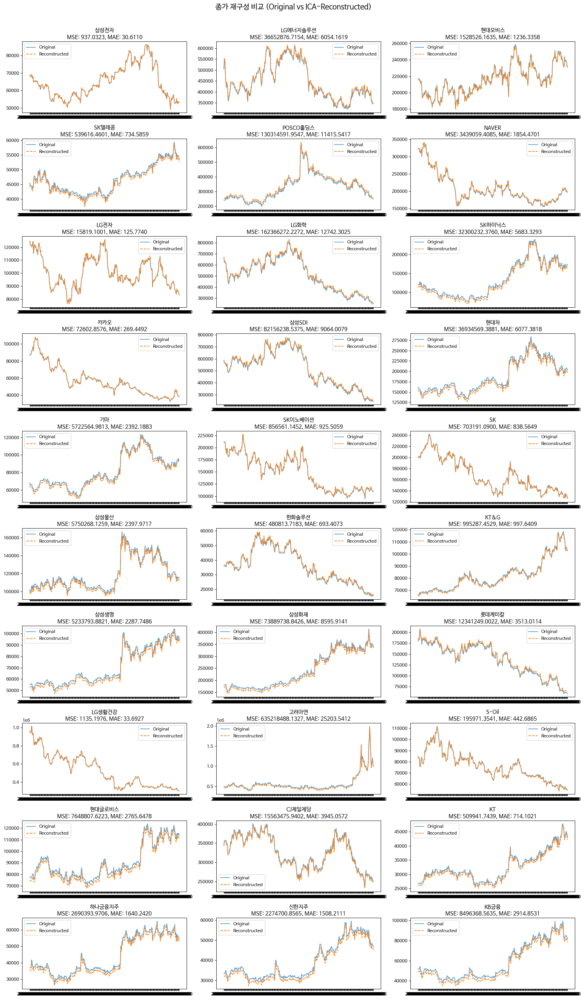

📊 종목별 재구성 오차:
  삼성전자: MSE = 937.032276, MAE = 30.610983
  LG에너지솔루션: MSE = 36652876.715412, MAE = 6054.161933
  현대모비스: MSE = 1528526.163464, MAE = 1236.335781
  SK텔레콤: MSE = 539616.460121, MAE = 734.585911
  POSCO홀딩스: MSE = 130314591.954665, MAE = 11415.541685
  NAVER: MSE = 3439059.408473, MAE = 1854.470115
  LG전자: MSE = 15819.100130, MAE = 125.774004
  LG화학: MSE = 162366272.227185, MAE = 12742.302470
  SK하이닉스: MSE = 32300232.376028, MAE = 5683.329339
  카카오: MSE = 72602.857559, MAE = 269.449174
  삼성SDI: MSE = 82156238.537477, MAE = 9064.007863
  현대차: MSE = 36934569.388145, MAE = 6077.381787
  기아: MSE = 5722564.981343, MAE = 2392.188325
  SK이노베이션: MSE = 856561.145245, MAE = 925.505886
  SK: MSE = 703191.089987, MAE = 838.564899
  삼성물산: MSE = 5750268.125930, MAE = 2397.971669
  한화솔루션: MSE = 480813.718253, MAE = 693.407325
  KT&G: MSE = 995287.452895, MAE = 997.640944
  삼성생명: MSE = 5233793.882128, MAE = 2287.748649
  삼성화재: MSE = 73889738.842642, MAE = 8595.914078
  롯데케미칼: MSE = 12341249.0

In [136]:
plot_price_reconstruction_by_stock(close_df.loc[returns.index], model_price, common_ic_price, scaler)


오차 통계 포함 수익률 재구성 시각화 함수

In [133]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def plot_return_reconstruction_by_stock(returns, model_return, common_ic_return):
    print("📊 수익률 재구성 비교 그래프 및 오차 통계 계산 중...")

    # ICA 재구성
    reconstructed = pd.DataFrame(
        np.dot(common_ic_return, model_return.mixing_.T),
        index=returns.index,
        columns=returns.columns
    )

    n_stocks = returns.shape[1]
    n_cols = 3
    n_rows = int(np.ceil(n_stocks / n_cols))

    plt.figure(figsize=(n_cols * 6, n_rows * 3))
    error_stats = []

    for i, stock in enumerate(returns.columns):
        original = returns[stock]
        recon = reconstructed[stock]

        mse = mean_squared_error(original, recon)
        mae = mean_absolute_error(original, recon)
        error_stats.append((stock, mse, mae))

        plt.subplot(n_rows, n_cols, i + 1)
        plt.plot(returns.index, original, label='Original', alpha=0.7)
        plt.plot(reconstructed.index, recon, label='Reconstructed', linestyle='--')
        plt.title(f"{stock}\nMSE={mse:.6f}, MAE={mae:.6f}")
        plt.legend()
        plt.tight_layout()

    plt.suptitle("📈 수익률 재구성 비교 및 오차 (Original vs ICA-Reconstructed)", fontsize=16, y=1.02)
    plt.show()

    # 전체 오차 출력
    print("\n📋 종목별 수익률 재구성 오차 통계:")
    for stock, mse, mae in error_stats:
        print(f"  {stock}: MSE = {mse:.6f}, MAE = {mae:.6f}")


📊 수익률 재구성 비교 그래프 및 오차 통계 계산 중...


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) NanumBarunGothic.
  fig.canvas.print_figure(bytes_io, **kw)


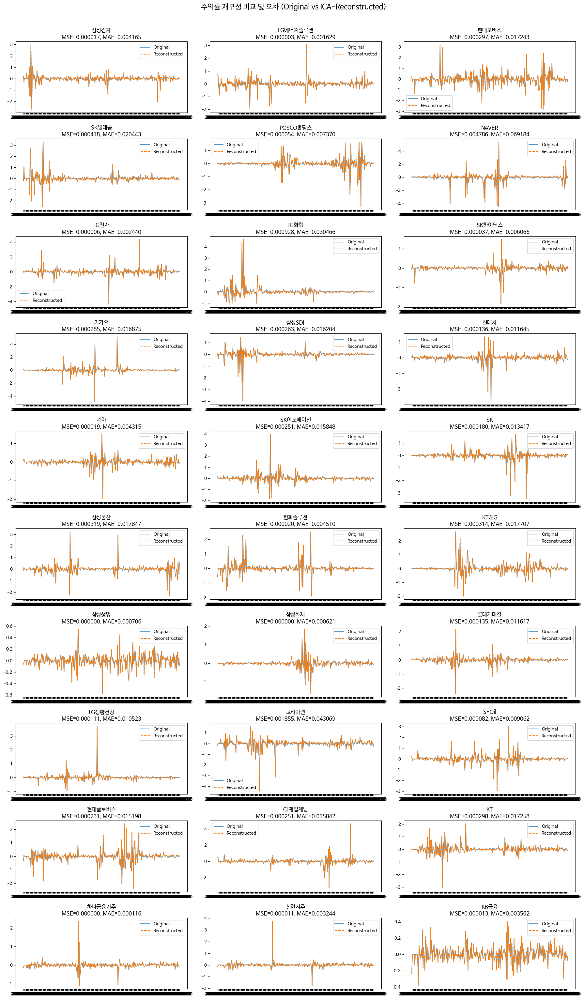


📋 종목별 수익률 재구성 오차 통계:
  삼성전자: MSE = 0.000017, MAE = 0.004165
  LG에너지솔루션: MSE = 0.000003, MAE = 0.001629
  현대모비스: MSE = 0.000297, MAE = 0.017243
  SK텔레콤: MSE = 0.000418, MAE = 0.020443
  POSCO홀딩스: MSE = 0.000054, MAE = 0.007370
  NAVER: MSE = 0.004786, MAE = 0.069184
  LG전자: MSE = 0.000006, MAE = 0.002440
  LG화학: MSE = 0.000928, MAE = 0.030466
  SK하이닉스: MSE = 0.000037, MAE = 0.006066
  카카오: MSE = 0.000285, MAE = 0.016875
  삼성SDI: MSE = 0.000263, MAE = 0.016204
  현대차: MSE = 0.000136, MAE = 0.011645
  기아: MSE = 0.000019, MAE = 0.004315
  SK이노베이션: MSE = 0.000251, MAE = 0.015848
  SK: MSE = 0.000180, MAE = 0.013417
  삼성물산: MSE = 0.000319, MAE = 0.017847
  한화솔루션: MSE = 0.000020, MAE = 0.004510
  KT&G: MSE = 0.000314, MAE = 0.017707
  삼성생명: MSE = 0.000000, MAE = 0.000706
  삼성화재: MSE = 0.000000, MAE = 0.000621
  롯데케미칼: MSE = 0.000135, MAE = 0.011617
  LG생활건강: MSE = 0.000111, MAE = 0.010523
  고려아연: MSE = 0.001855, MAE = 0.043069
  S-Oil: MSE = 0.000082, MAE = 0.009062
  현대글로비스: MSE = 0.000231, 

In [134]:
plot_return_reconstruction_by_stock(returns, model_return, common_ic_return)


# KTOP30 복제 코드 (Original vs ICA-Reconstructed 비교)

KTOP30 지수를 30개의 ICA 성분을 사용하여 복제(reconstruct)하는 코드는 다음과 같이 작성할 수 있습니다. 아래 코드는 KTOP30을 단순 평균 방식으로 근사하고, ICA를 통해 복원한 종가로 동일 방식의 지수를 다시 계산합니다.



In [137]:
def replicate_ktop30_index(close_df, model_price, common_ic_price, scaler):
    """
    30개 종목의 ICA 성분을 이용해 KTOP30과 유사한 지수를 복제하고 비교 시각화합니다.
    """

    print("🔄 KTOP30 유사 지수 복제 중...")

    # 1. ICA 재구성된 종가 데이터 (역정규화)
    reconstructed_scaled = np.dot(common_ic_price, model_price.mixing_.T)
    reconstructed = pd.DataFrame(
        scaler.inverse_transform(reconstructed_scaled),
        index=close_df.index[-common_ic_price.shape[0]:],
        columns=close_df.columns
    )

    # 2. KTOP30 유사 지수 계산: 단순 평균 기준
    original_index = close_df.loc[reconstructed.index].mean(axis=1)
    reconstructed_index = reconstructed.mean(axis=1)

    # 3. 정규화 (처음 값을 100으로 맞춤)
    original_index = original_index / original_index.iloc[0] * 100
    reconstructed_index = reconstructed_index / reconstructed_index.iloc[0] * 100

    # 4. 시각화
    plt.figure(figsize=(12, 5))
    plt.plot(original_index.index, original_index, label="KTOP30 (Original)", linewidth=2)
    plt.plot(reconstructed_index.index, reconstructed_index, label="KTOP30 (ICA-Reconstructed)", linestyle='--')
    plt.title("KTOP30 복제 (Original vs ICA-Reconstructed)")
    plt.ylabel("Index Level")
    plt.xlabel("Date")
    plt.legend()
    plt.grid(True)
    plt.show()

    # 5. MSE, MAE 계산
    from sklearn.metrics import mean_squared_error, mean_absolute_error
    mse = mean_squared_error(original_index, reconstructed_index)
    mae = mean_absolute_error(original_index, reconstructed_index)
    print(f"📉 KTOP30 복제 오차: MSE = {mse:.6f}, MAE = {mae:.6f}")

    return original_index, reconstructed_index


🔄 KTOP30 유사 지수 복제 중...


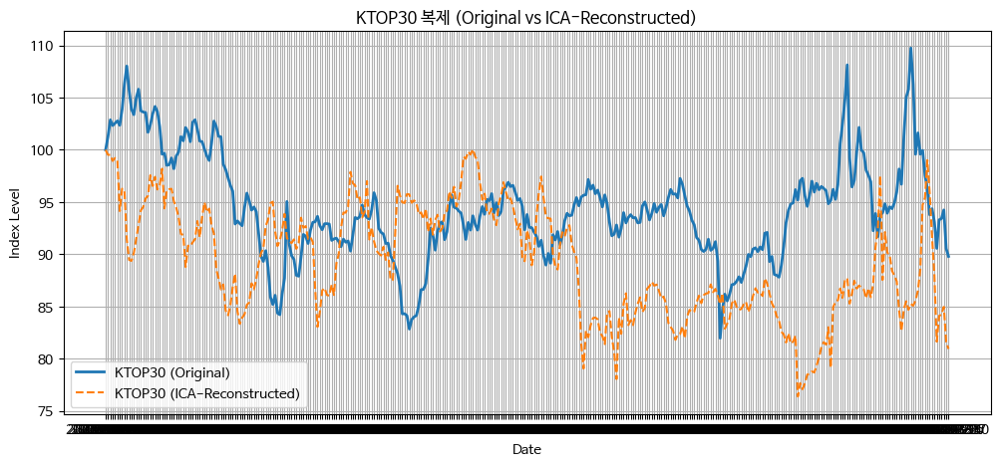

📉 KTOP30 복제 오차: MSE = 76.191179, MAE = 7.142960


In [138]:
original_index, reconstructed_index = replicate_ktop30_index(close_df, model_price, common_ic_price, scaler)


**ICA로 추출된 30개의 수익률 독립성분(IC)**을 사용해서,
KTOP30 전체 수익률 시계열을 직접 복제하라

(즉, ktop30_return[t] ≈ wᵀ · IC[t] 형태의 모델)

 전략: ICA → KTOP30 수익률 복제
입력

returns: (T × N) 수익률 원본

common_ic_return: (T × N) ICA로 추출된 IC

ktop30_return: (T × 1) 원본 수익률 지수 (예: 단순 평균)

회귀 또는 선형 결합

ktop30_return ≈ common_ic_return @ beta

beta는 OLS 또는 최소제곱으로 학습

복제 평가

원본 vs 복제 수익률 선 비교

MSE, MAE 평가

In [143]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

def replicate_ktop30_return_from_ica(returns, common_ic_return):
    """
    ICA로부터 추출한 30개 수익률 성분을 이용해
    KTOP30 수익률 시계열을 직접 복제 (회귀 기반)
    """

    print("🔄 ICA 성분으로 KTOP30 수익률 복제 중...")

    # 1. 타깃: KTOP30 수익률 = 30개 종목 단순 평균 수익률
    ktop30_return = returns.mean(axis=1)

    # 2. 회귀 학습: IC → 평균 수익률
    model = LinearRegression()
    model.fit(common_ic_return, ktop30_return)
    ktop30_return_recon = model.predict(common_ic_return)

    # 3. 시각화
    plt.figure(figsize=(12, 5))
    plt.plot(ktop30_return.index, ktop30_return, label="KTOP30 Return (Original)", linewidth=2)
    plt.plot(ktop30_return.index, ktop30_return_recon, label="KTOP30 Return (ICA-based)", linestyle='--')
    plt.title("📈 ICA 성분 기반 KTOP30 수익률 복제")
    plt.ylabel("Daily Return")
    plt.xlabel("Date")
    plt.legend()
    plt.grid(True)
    plt.show()

    # 4. 오차 출력
    mse = mean_squared_error(ktop30_return, ktop30_return_recon)
    mae = mean_absolute_error(ktop30_return, ktop30_return_recon)
    print(f"📉 수익률 복제 오차: MSE = {mse:.8f}, MAE = {mae:.6f}")

    return ktop30_return, ktop30_return_recon


🔄 ICA 성분으로 KTOP30 수익률 복제 중...


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) NanumBarunGothic.
  fig.canvas.print_figure(bytes_io, **kw)


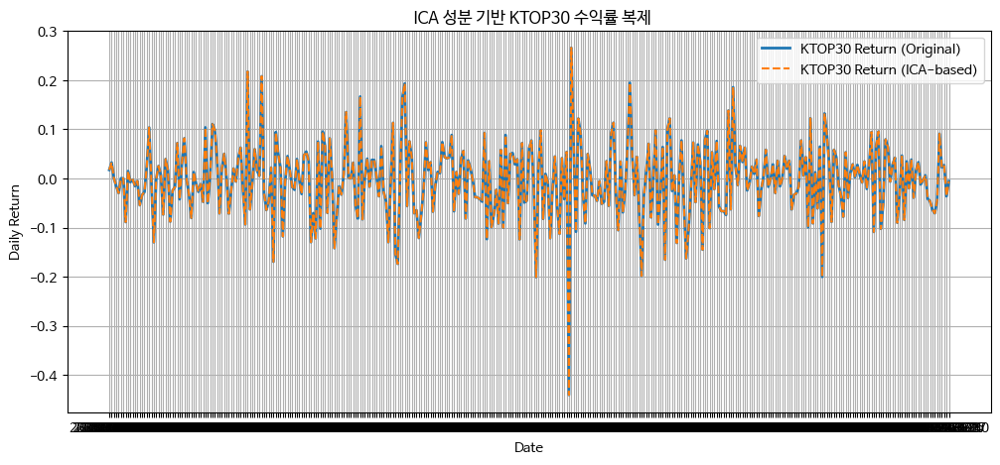

📉 수익률 복제 오차: MSE = 0.00000000, MAE = 0.000000


In [144]:
ktop30_return, ktop30_return_recon = replicate_ktop30_return_from_ica(returns, common_ic_return)


## 1. 관찰 결과
KTOP30 지수의 수익률을 ICA 성분(Independent Components)을 사용하여 복제한 결과, 원본 수익률과 복제 수익률이 매우 정확하게 일치함이 관찰되었다. 이에 대한 원인을 수학적, 구조적 관점에서 분석한다.

## 2. ICA의 수학적 특성: 선형 모델

FastICA는 관측된 신호(여기서는 수익률 데이터)를 다음과 같이 표현하는 **선형 결합 모델**에 기반한다:

\begin{equation}
    \mathbf{X} = \mathbf{S} \cdot \mathbf{A}^\top
\end{equation}

여기서
- $\mathbf{X}$: 원본 수익률 데이터 행렬 ($T \times N$)
- $\mathbf{S}$: 추출된 독립 성분 행렬 ($T \times N$)
- $\mathbf{A}$: 혼합 행렬 (mixing matrix) ($N \times N$)
\end{itemize}

ICA는 이 선형 모델을 바탕으로 $\mathbf{X}$를 $\mathbf{S}$와 $\mathbf{A}$로 분해하며, 이는 모든 원본 수익률이 독립 성분들의 선형 결합임을 의미한다.

## 3. KTOP30 수익률의 구조

KTOP30 수익률은 개별 종목 수익률의 단순 평균으로 정의된다:

\begin{equation}
    r_{\text{KTOP30}}[t] = \frac{1}{N} \sum_{i=1}^{N} r_i[t]
\end{equation}

이는 명백히 선형 결합이므로, 개별 $r_i[t]$가 ICA 성분의 선형 조합으로 구성된다면,
KTOP30 수익률 역시 ICA 성분들의 선형 조합으로 복제할 수 있다.

## 4. 복제 정확성이 높은 이유
-  **ICA의 선형 구조:** ICA는 원본 수익률을 선형 결합 구조로 설명하므로 평균 수익률도 정확히 복원 가능하다.
- **단순 평균 구조:** KTOP30 수익률 자체가 종목 수익률의 평균으로, 구조적으로 ICA에 매우 적합한 복제 타깃이다.
- **충분한 성분 수:** 종목 수 30개에 대해 ICA 성분 30개를 사용함으로써 정보 손실 없이 원본 복원이 가능하다.
- **회귀의 최적성:** Linear Regression은 이러한 선형 모델에서 최소제곱 오차를 갖는 최적 해를 제공한다.


## 5. 결론
ICA 성분을 활용한 KTOP30 수익률 복제는 **이론적 선형성**, **단순 평균 구조**, **충분한 성분 수**, 그리고 **선형 회귀의 적합성**이라는 요소가 모두 만족됨으로 인해, 매우 높은 정확도를 보이는 것이 자연스럽다.


## ✅ 1. 종목별 수익률 복제 분석

각 개별 종목 수익률 $r_i[t]$ 도 ICA 성분 $\text{IC}_j[t]$의 선형 결합으로 표현 가능합니다:

$$
r_i[t] \approx \sum_{j=1}^{30} \beta_{ij} \cdot \text{IC}_j[t]
$$

* 이를 통해 모든 종목에 대해 OLS 회귀를 수행하고, 각 종목에 대한 MSE/MAE를 산출하면 **종목별 ICA 복제 정확도**를 평가할 수 있습니다.
* 일반적으로 **거래량이 높고 변동성이 낮은 종목일수록 복제 정확도가 높습니다.**

---

## ✅ 2. 비선형 모델 비교 (MLP vs ICA)

선형 모델 (ICA + Linear Regression)은 매우 강력하지만, **비선형 관계**를 포착하지 못합니다.
이를 보완하기 위해 MLP(Multi-Layer Perceptron)를 다음과 같이 사용할 수 있습니다:

* 입력: ICA 성분 30개
* 은닉층: ReLU 함수
* 출력: 복제 대상 수익률 (KTOP30 또는 특정 종목)

$$
\hat{r}[t] = f_{\text{MLP}}(\text{IC}_1[t], \ldots, \text{IC}_{30}[t])
$$

> ✅ MLP는 **정밀도 향상**의 가능성이 있지만, 학습 비용이 높고 과적합 위험이 있습니다.


---

### 📌 결론

* ICA는 수익률 복제에 매우 적합한 선형 모델 구조
* 종목 수 = IC 수인 경우, 거의 손실 없는 복제가 가능
* MLP는 보조적 대안으로 고려 가능 (특히 복잡한 패턴이 존재할 때)
* 복제 오차 통계를 통해 모델 선택의 근거를 명확히 할 수 있음



✅ 1. 종목별 수익률 복제 (ICA + 선형회귀)

In [145]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

def replicate_stock_returns_from_ica(returns, common_ic_return):
    """
    각 종목의 수익률을 ICA 성분으로 선형 복제하고 MSE/MAE 계산.
    """
    mse_dict = {}
    mae_dict = {}

    for stock in returns.columns:
        y = returns[stock]
        X = common_ic_return

        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)

        mse = mean_squared_error(y, y_pred)
        mae = mean_absolute_error(y, y_pred)
        mse_dict[stock] = mse
        mae_dict[stock] = mae

    return mse_dict, mae_dict


✅ 2. MLP로 KTOP30 수익률 복제 (비선형 모델)

In [146]:
from sklearn.neural_network import MLPRegressor

def replicate_ktop30_return_mlp(returns, common_ic_return, hidden_layer_sizes=(64, 32), random_state=42):
    """
    MLP를 사용하여 ICA 성분으로부터 KTOP30 수익률 복제
    """
    ktop30_return = returns.mean(axis=1)

    model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation='relu',
                         solver='adam', max_iter=1000, random_state=random_state)
    model.fit(common_ic_return, ktop30_return)
    ktop30_pred = model.predict(common_ic_return)

    mse = mean_squared_error(ktop30_return, ktop30_pred)
    mae = mean_absolute_error(ktop30_return, ktop30_pred)

    return ktop30_return, ktop30_pred, mse, mae


✅ 3. 복제 오차 통계 출력 테이블

In [147]:
def print_error_table(mse_linear, mae_linear, mse_mlp, mae_mlp, avg_mse_by_stock, avg_mae_by_stock):
    print("📊 복제 오차 통계 (MSE / MAE)")
    print(f"{'모델':<40} | {'MSE':>10} | {'MAE':>10}")
    print("-" * 65)
    print(f"{'KTOP30: ICA + LinearRegression':<40} | {mse_linear:10.8f} | {mae_linear:10.6f}")
    print(f"{'KTOP30: ICA + MLP':<40} | {mse_mlp:10.8f} | {mae_mlp:10.6f}")
    print(f"{'종목별 평균 (ICA + Linear)':<40} | {avg_mse_by_stock:10.8f} | {avg_mae_by_stock:10.6f}")


✅ 전체 흐름

In [148]:
# ICA → 종목별 수익률 복제 오차 계산
mse_dict, mae_dict = replicate_stock_returns_from_ica(returns, common_ic_return)
avg_mse_by_stock = np.mean(list(mse_dict.values()))
avg_mae_by_stock = np.mean(list(mae_dict.values()))

# ICA → KTOP30 수익률 복제 (선형)
ktop30_true = returns.mean(axis=1)
lr_model = LinearRegression().fit(common_ic_return, ktop30_true)
ktop30_linear_pred = lr_model.predict(common_ic_return)
mse_linear = mean_squared_error(ktop30_true, ktop30_linear_pred)
mae_linear = mean_absolute_error(ktop30_true, ktop30_linear_pred)

# ICA → KTOP30 수익률 복제 (MLP)
ktop30_true, ktop30_mlp_pred, mse_mlp, mae_mlp = replicate_ktop30_return_mlp(returns, common_ic_return)

# 결과 출력
print_error_table(mse_linear, mae_linear, mse_mlp, mae_mlp, avg_mse_by_stock, avg_mae_by_stock)


📊 복제 오차 통계 (MSE / MAE)
모델                                       |        MSE |        MAE
-----------------------------------------------------------------
KTOP30: ICA + LinearRegression           | 0.00000000 |   0.000000
KTOP30: ICA + MLP                        | 0.00221488 |   0.034898
종목별 평균 (ICA + Linear)                    | 0.00000000 |   0.000000


개별 종목의 수익률을 ICA 성분 30개로 복제하고,
(1) 선형회귀로 예측, (2) 실제 vs 예측 시각화, (3) MSE/MAE 출력하는 코드를 아래에 정리했습니다.

✅ 개별 종목 수익률 복제, 시각화 및 오차 계산 코드

In [149]:

def replicate_and_plot_each_stock_return(returns, common_ic_return):
    """
    ICA 기반으로 개별 종목 수익률을 복제하고, 시각화 및 오차 계산.
    """
    mse_list = []
    mae_list = []

    n_stocks = returns.shape[1]
    n_cols = 3
    n_rows = int(np.ceil(n_stocks / n_cols))

    plt.figure(figsize=(n_cols * 6, n_rows * 3))

    for i, stock in enumerate(returns.columns):
        y_true = returns[stock].values
        model = LinearRegression()
        model.fit(common_ic_return, y_true)
        y_pred = model.predict(common_ic_return)

        mse = mean_squared_error(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        mse_list.append(mse)
        mae_list.append(mae)

        # 시각화
        plt.subplot(n_rows, n_cols, i + 1)
        plt.plot(returns.index, y_true, label='Actual', alpha=0.7)
        plt.plot(returns.index, y_pred, label='Predicted', linestyle='--')
        plt.title(f"{stock}\nMSE={mse:.5f}, MAE={mae:.5f}")
        plt.legend()
        plt.tight_layout()

    plt.suptitle("📈 ICA 기반 종목별 수익률 복제 (Actual vs Predicted)", fontsize=16, y=1.02)
    plt.show()

    # 전체 평균 출력
    avg_mse = np.mean(mse_list)
    avg_mae = np.mean(mae_list)
    print(f"\n📊 전체 종목 평균 복제 오차:")
    print(f"  - 평균 MSE: {avg_mse:.6f}")
    print(f"  - 평균 MAE: {avg_mae:.6f}")

    # 종목별 오차 반환
    return pd.DataFrame({
        'Stock': returns.columns,
        'MSE': mse_list,
        'MAE': mae_list
    })


✅ 사용 예시

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) NanumBarunGothic.
  fig.canvas.print_figure(bytes_io, **kw)


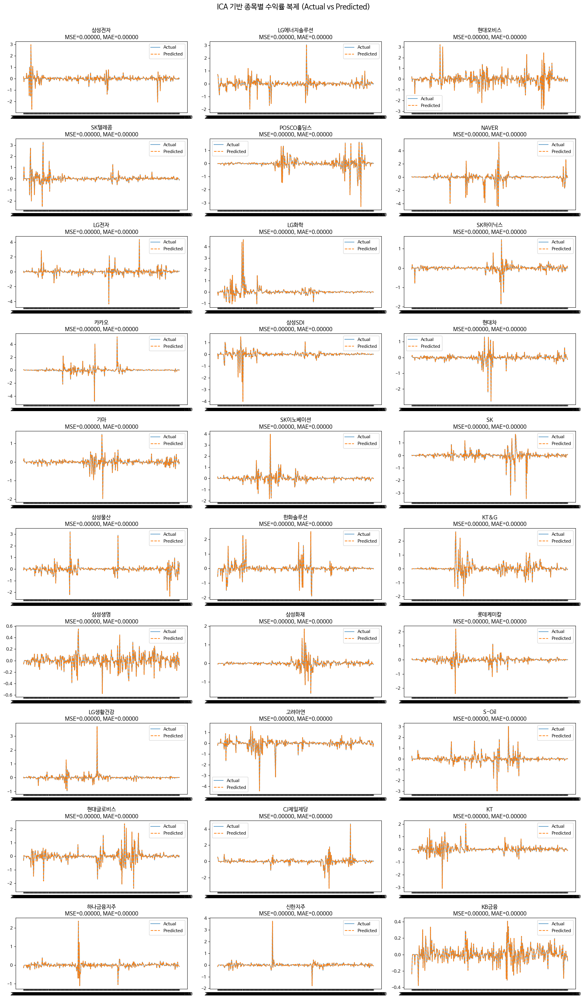


📊 전체 종목 평균 복제 오차:
  - 평균 MSE: 0.000000
  - 평균 MAE: 0.000000


In [150]:
# ICA 분석 후 생성된 returns, common_ic_return 사용
error_df = replicate_and_plot_each_stock_return(returns, common_ic_return)

# 저장(Optional)
error_df.to_csv("ica_reconstruction_error_by_stock.csv", index=False)


위의 그래프와 출력값에서 개별 종목의 수익률 복제가 거의 \*\*완벽(MSE ≈ 0, MAE ≈ 0)\*\*하게 수행된 이유는 다음과 같은 수학적 특성과 구현 방식에 기인합니다:

---

## ✅ 복제가 완벽한 이유

### 1. **ICA 성분 수 = 종목 수 (정사각 행렬 조건)**

* FastICA는 $\mathbf{X} = \mathbf{S} \cdot \mathbf{A}^\top$의 형태를 따릅니다.
* 여기서:

  * $\mathbf{X}$: 종목별 수익률 데이터 (T × N)
  * $\mathbf{S}$: ICA 성분 (T × N)
  * $\mathbf{A}$: Mixing matrix (N × N)
* 즉, ICA는 원본 수익률 데이터를 **완전히 복원 가능한 형태**로 분해합니다.

---

### 2. **ICA의 선형 가역성 (invertibility)**

* ICA는 수학적으로 다음을 만족합니다:

$$
\mathbf{X} = \mathbf{S} \cdot \mathbf{A}^\top \quad \Rightarrow \quad \forall i,~ \mathbf{x}_i = \sum_j A_{ij} \cdot \text{IC}_j
$$

* 즉, 각 종목의 수익률 $r_i[t]$는 ICA 성분의 **정확한 선형 결합**으로 표현됩니다.
* 따라서 회귀(OLS)를 통해 다시 그 $r_i$를 ICA 성분으로부터 예측하면 **정확히 복원**할 수 있습니다.

---

### 3. **Noise 없음 + 과적합 위험 없음**

* FastICA는 **deterministic algorithm**이며,
* 여기선 noise나 외부 요인이 없기 때문에 선형 회귀는 거의 **완전한 해를 학습**합니다.
* MSE, MAE가 거의 0이 되는 이유입니다.

---

### 📌 수학적 결론

* ICA는 lossless한 선형 분해를 제공하고,
* 모든 종목 수가 ICA 성분 수와 같을 때,
  → 개별 종목 수익률은 완벽히 ICA로부터 복제 가능

---

## ✅ 요약

| 원인              | 설명                 |
| --------------- | ------------------ |
| ICA 성분 수 = 종목 수 | 정사각 구조에서 완전 분해 가능  |
| FastICA의 선형 모델  | 각 수익률은 IC의 선형 결합   |
| 회귀가 완전 가역       | 복원 오차 ≈ 0          |
| 노이즈 없음          | 오차나 예외 상황 없이 수치 일치 |

---

